<a href="https://colab.research.google.com/github/jungeun1228/2026_04_cell_painting_analysis_OASIS/blob/main/Cell_painting_analysis_OASIS.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 1) Import data files

In [ ]:
# This is raw data files from Ewald et al. (2026) - https://github.com/jessica-ewald/2024_09_09_Axiom_OASIS
# A Python file from the following location was executed in the terminal to download a compiled input file:
# 2024_09_09_Axiom_OASIS/0_prepare_data/4A_download_compiled_inputs.py

import pandas as pd
import numpy as np
import requests

!pip install -q gdown
!gdown --id 1CC21tnvSvRvtNNSRX8-0vV6qcmTnqI1E -O /content/raw.parquet

/usr/local/lib/python3.12/dist-packages/gdown/__main__.py:139: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From (original): https://drive.google.com/uc?id=1CC21tnvSvRvtNNSRX8-0vV6qcmTnqI1E
From (redirected): https://drive.google.com/uc?id=1CC21tnvSvRvtNNSRX8-0vV6qcmTnqI1E&confirm=t&uuid=bdf81eab-313a-441f-8779-c741483f0e32
To: /content/raw.parquet
100% 413M/413M [00:08<00:00, 46.9MB/s]


In [ ]:
df_raw = pd.read_parquet("raw.parquet")
df_raw

,Metadata_well_id,Metadata_source,Metadata_Plate,Metadata_Concentration,Metadata_Compound,Metadata_compound_target,Metadata_compound_pathway,Metadata_compound_research_area,Metadata_compound_clinical_information,Metadata_Well,...,Nuclei_Texture_Variance_RNA_10_02_256,Nuclei_Texture_Variance_RNA_10_03_256,Nuclei_Texture_Variance_RNA_3_00_256,Nuclei_Texture_Variance_RNA_3_01_256,Nuclei_Texture_Variance_RNA_3_02_256,Nuclei_Texture_Variance_RNA_3_03_256,Nuclei_Texture_Variance_RNA_5_00_256,Nuclei_Texture_Variance_RNA_5_01_256,Nuclei_Texture_Variance_RNA_5_02_256,Nuclei_Texture_Variance_RNA_5_03_256
0,assayworks_prod_26_p=plate_41002878_r=0_c=0,assayworks_prod_26,plate_41002878,100.0,"1,4-Dibromobenzene",None,None,None,No Development Reported,A01,...,3.0341,3.1077,2.9159,2.9334,2.9132,2.9362,2.9490,2.9822,2.9453,2.9872
1,assayworks_prod_26_p=plate_41002878_r=0_c=1,assayworks_prod_26,plate_41002878,100.0,"2,2,3,3,4,4,5,5,6,6,7,7,8,8,9,9,9-Heptadecaflu...",None,None,None,None,A02,...,2.3187,2.3546,2.2794,2.2829,2.2794,2.2841,2.2871,2.2982,2.2865,2.3010
2,assayworks_prod_26_p=plate_41002878_r=0_c=2,assayworks_prod_26,plate_41002878,100.0,Calcifediol,Endogenous Metabolite; VD/VDR,Metabolic Enzyme/Protease; Vitamin D Related/N...,Metabolic Disease,Launched,A03,...,3.0126,3.0278,3.0800,3.0518,3.0812,3.0445,3.0351,3.0170,3.0377,3.0064
3,assayworks_prod_26_p=plate_41002878_r=0_c=3,assayworks_prod_26,plate_41002878,0.0,DMSO,None,None,None,None,A04,...,2.9056,2.9468,2.8565,2.8604,2.8541,2.8584,2.8663,2.8793,2.8639,2.8785
4,assayworks_prod_26_p=plate_41002878_r=0_c=4,assayworks_prod_26,plate_41002878,100.0,DHEA,Androgen Receptor; Endogenous Metabolite,Metabolic Enzyme/Protease; Vitamin D Related/N...,Endocrinology; Cancer,Launched,A05,...,2.3178,2.3498,2.2871,2.2889,2.2830,2.2899,2.2960,2.3024,2.2894,2.3049
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21450,assayworks_prod_30_p=plate_41002959_r=15_c=19,assayworks_prod_30,plate_41002959,0.0,DMSO,None,None,None,None,P20,...,1.5253,1.5349,1.5304,1.5259,1.5302,1.5268,1.5257,1.5227,1.5250,1.5254
21451,assayworks_prod_30_p=plate_41002959_r=15_c=20,assayworks_prod_30,plate_41002959,1.0,Compound_2ba46d57,None,None,None,None,P21,...,1.2864,1.3059,1.2959,1.2858,1.2938,1.2971,1.2919,1.2804,1.2878,1.2970
21452,assayworks_prod_30_p=plate_41002959_r=15_c=21,assayworks_prod_30,plate_41002959,1.0,Fosfluconazole,Fungal,Anti-infection,Infection,Launched,P22,...,1.5495,1.5502,1.5432,1.5443,1.5459,1.5405,1.5386,1.5451,1.5428,1.5395
21453,assayworks_prod_30_p=plate_41002959_r=15_c=22,assayworks_prod_30,plate_41002959,1.0,Aliskiren,Autophagy; Renin,Autophagy; Metabolic Enzyme/Protease,Cardiovascular Disease; Cancer,Launched,P23,...,2.1201,2.1217,2.1355,2.1270,2.1346,2.1285,2.1257,2.1187,2.1252,2.1214


# 2) Explore the data

In [ ]:
# Check the number of compounds
df_raw["Metadata_Compound"].nunique()

1086

In [ ]:
# Check the number of DMSO per plate
dmso_df = df_raw[df_raw["Metadata_Compound"] == "DMSO"]
dmso_counts = dmso_df.groupby("Metadata_Plate").size().reset_index(name="DMSO_count")

print(dmso_counts)

    Metadata_Plate  DMSO_count
0   plate_41002687         160
1   plate_41002688          69
2   plate_41002689          69
3   plate_41002690          69
4   plate_41002691          69
..             ...         ...
60  plate_41002956          69
61  plate_41002957          69
62  plate_41002958          69
63  plate_41002959          69
64  plate_41002960         160

[65 rows x 2 columns]


In [ ]:
# Check the number of data per plate
data_per_plate = df_raw.groupby("Metadata_Plate").size().reset_index(name="data_count")
data_count_over_384 = data_per_plate[data_per_plate['data_count'] > 384]
data_count_over_384

,Metadata_Plate,data_count
2,plate_41002689,388
4,plate_41002691,389
5,plate_41002692,389
7,plate_41002694,389
11,plate_41002701,389
13,plate_41002703,389
14,plate_41002875,388
15,plate_41002876,390
17,plate_41002878,390
18,plate_41002879,387


In [ ]:
# Check duplicates and remove complete duplicates
print(f"Complete duplicates: {df_raw.duplicated().sum()}")

df_raw = df_raw.drop_duplicates().reset_index(drop=True)
print(f"Complete duplicates were removed")

Complete duplicates: 136
Complete duplicates were removed


In [ ]:
# Check partial duplicates with the same "Metadata_well_id"
pd.set_option('display.max_rows', None)
print(f"Partial duplicates: {df_raw.duplicated(subset = "Metadata_well_id").sum()}")

df_partial_dups = df_raw[df_raw.duplicated(subset = "Metadata_well_id", keep = False)]
df_partial_dups

Partial duplicates: 14


,Metadata_well_id,Metadata_source,Metadata_Plate,Metadata_Concentration,Metadata_Compound,Metadata_compound_target,Metadata_compound_pathway,Metadata_compound_research_area,Metadata_compound_clinical_information,Metadata_Well,...,Nuclei_Texture_Variance_RNA_10_02_256,Nuclei_Texture_Variance_RNA_10_03_256,Nuclei_Texture_Variance_RNA_3_00_256,Nuclei_Texture_Variance_RNA_3_01_256,Nuclei_Texture_Variance_RNA_3_02_256,Nuclei_Texture_Variance_RNA_3_03_256,Nuclei_Texture_Variance_RNA_5_00_256,Nuclei_Texture_Variance_RNA_5_01_256,Nuclei_Texture_Variance_RNA_5_02_256,Nuclei_Texture_Variance_RNA_5_03_256
332,assayworks_prod_26_p=plate_41002878_r=13_c=21,assayworks_prod_26,plate_41002878,100.000000,Vasopressin,Endogenous Metabolite,Metabolic Enzyme/Protease,Neurological Disease,Launched,N22,...,2.3637,2.3976,2.2932,2.3024,2.2914,2.3046,2.3119,2.3315,2.3099,2.3334
333,assayworks_prod_26_p=plate_41002878_r=13_c=21,assayworks_prod_26,plate_41002878,100.000000,Vasopressin,Endogenous Metabolite,Metabolic Enzyme/Protease,Neurological Disease,Launched,N22,...,2.3637,2.3976,2.2932,2.3024,2.2914,2.3046,2.3119,2.3315,2.3099,2.3334
1757,assayworks_prod_25_p=plate_41002692_r=14_c=4,assayworks_prod_25,plate_41002692,100.000000,Vasopressin,Endogenous Metabolite,Metabolic Enzyme/Protease,Neurological Disease,Launched,O05,...,1.9301,1.9587,1.8625,1.8748,1.8622,1.8716,1.8812,1.9037,1.8804,1.8980
1758,assayworks_prod_25_p=plate_41002692_r=14_c=4,assayworks_prod_25,plate_41002692,100.000000,Vasopressin,Endogenous Metabolite,Metabolic Enzyme/Protease,Neurological Disease,Launched,O05,...,1.9301,1.9587,1.8625,1.8748,1.8622,1.8716,1.8812,1.9037,1.8804,1.8980
2084,assayworks_prod_26_p=plate_41002887_r=11_c=18,assayworks_prod_26,plate_41002887,0.410788,Vasopressin,Endogenous Metabolite,Metabolic Enzyme/Protease,Neurological Disease,Launched,L19,...,1.5993,1.6129,1.5730,1.5737,1.5752,1.5756,1.5746,1.5821,1.5776,1.5839
2085,assayworks_prod_26_p=plate_41002887_r=11_c=18,assayworks_prod_26,plate_41002887,0.410788,Vasopressin,Endogenous Metabolite,Metabolic Enzyme/Protease,Neurological Disease,Launched,L19,...,1.5993,1.6129,1.5730,1.5737,1.5752,1.5756,1.5746,1.5821,1.5776,1.5839
3088,assayworks_prod_26_p=plate_41002889_r=5_c=13,assayworks_prod_26,plate_41002889,33.500000,Vasopressin,Endogenous Metabolite,Metabolic Enzyme/Protease,Neurological Disease,Launched,F14,...,1.7753,1.7877,1.7351,1.7436,1.7379,1.7381,1.7424,1.7596,1.7461,1.7506
3089,assayworks_prod_26_p=plate_41002889_r=5_c=13,assayworks_prod_26,plate_41002889,33.500000,Vasopressin,Endogenous Metabolite,Metabolic Enzyme/Protease,Neurological Disease,Launched,F14,...,1.7753,1.7877,1.7351,1.7436,1.7379,1.7381,1.7424,1.7596,1.7461,1.7506
3855,assayworks_prod_26_p=plate_41002885_r=5_c=12,assayworks_prod_26,plate_41002885,3.500000,Vasopressin,Endogenous Metabolite,Metabolic Enzyme/Protease,Neurological Disease,Launched,F13,...,2.4004,2.4339,2.3467,2.3504,2.3473,2.3570,2.3591,2.3689,2.3597,2.3794
3856,assayworks_prod_26_p=plate_41002885_r=5_c=12,assayworks_prod_26,plate_41002885,3.500000,Vasopressin,Endogenous Metabolite,Metabolic Enzyme/Protease,Neurological Disease,Launched,F13,...,2.4004,2.4339,2.3467,2.3504,2.3473,2.3570,2.3591,2.3689,2.3597,2.3794


In [ ]:
# Check all rows with "Vasopressin"
pd.set_option('display.max_columns', None)
df_raw[df_raw['Metadata_Compound'] == "Vasopressin"]

,Metadata_well_id,Metadata_source,Metadata_Plate,Metadata_Concentration,Metadata_Compound,Metadata_compound_target,Metadata_compound_pathway,Metadata_compound_research_area,Metadata_compound_clinical_information,Metadata_Well,Metadata_row,Metadata_col,Metadata_mtt_lumi,Metadata_ldh_abs_signal,Metadata_ldh_abs_background,Metadata_ldh_abs,Metadata_mtt_normalized,Metadata_ldh_normalized,Metadata_mtt_ridge_norm,Metadata_ldh_ridge_norm,Metadata_OASIS_ID,Metadata_Perturbation,Metadata_Log10Conc,Metadata_Count_Cells,Metadata_Site_Count,Metadata_Count_Cells_right,Metadata_Count_CellsIncludingEdges,Metadata_Count_Cytoplasm,Metadata_Count_Nuclei,Metadata_Count_NucleiIncludingEdges,Metadata_Object_Count,Image_Granularity_10_AGP,Image_Granularity_10_Brightfield,Image_Granularity_10_DNA,Image_Granularity_10_ER,Image_Granularity_10_Mito,Image_Granularity_10_RNA,Image_Granularity_11_AGP,Image_Granularity_11_Brightfield,Image_Granularity_11_DNA,Image_Granularity_11_ER,Image_Granularity_11_Mito,Image_Granularity_11_RNA,Image_Granularity_12_AGP,Image_Granularity_12_Brightfield,Image_Granularity_12_DNA,Image_Granularity_12_ER,Image_Granularity_12_Mito,Image_Granularity_12_RNA,Image_Granularity_13_AGP,Image_Granularity_13_Brightfield,Image_Granularity_13_DNA,Image_Granularity_13_ER,Image_Granularity_13_Mito,Image_Granularity_13_RNA,Image_Granularity_14_AGP,Image_Granularity_14_Brightfield,Image_Granularity_14_DNA,Image_Granularity_14_ER,Image_Granularity_14_Mito,Image_Granularity_14_RNA,Image_Granularity_15_AGP,Image_Granularity_15_Brightfield,Image_Granularity_15_DNA,Image_Granularity_15_ER,Image_Granularity_15_Mito,Image_Granularity_15_RNA,Image_Granularity_16_AGP,Image_Granularity_16_Brightfield,Image_Granularity_16_DNA,Image_Granularity_16_ER,Image_Granularity_16_Mito,Image_Granularity_16_RNA,Image_Granularity_1_AGP,Image_Granularity_1_Brightfield,Image_Granularity_1_DNA,Image_Granularity_1_ER,Image_Granularity_1_Mito,Image_Granularity_1_RNA,Image_Granularity_2_AGP,Image_Granularity_2_Brightfield,Image_Granularity_2_DNA,Image_Granularity_2_ER,Image_Granularity_2_Mito,Image_Granularity_2_RNA,Image_Granularity_3_AGP,Image_Granularity_3_Brightfield,Image_Granularity_3_DNA,Image_Granularity_3_ER,Image_Granularity_3_Mito,Image_Granularity_3_RNA,Image_Granularity_4_AGP,Image_Granularity_4_Brightfield,Image_Granularity_4_DNA,Image_Granularity_4_ER,Image_Granularity_4_Mito,Image_Granularity_4_RNA,Image_Granularity_5_AGP,Image_Granularity_5_Brightfield,Image_Granularity_5_DNA,Image_Granularity_5_ER,Image_Granularity_5_Mito,Image_Granularity_5_RNA,Image_Granularity_6_AGP,Image_Granularity_6_Brightfield,Image_Granularity_6_DNA,Image_Granularity_6_ER,Image_Granularity_6_Mito,Image_Granularity_6_RNA,Image_Granularity_7_AGP,Image_Granularity_7_Brightfield,Image_Granularity_7_DNA,Image_Granularity_7_ER,Image_Granularity_7_Mito,Image_Granularity_7_RNA,Image_Granularity_8_AGP,Image_Granularity_8_Brightfield,Image_Granularity_8_DNA,Image_Granularity_8_ER,Image_Granularity_8_Mito,Image_Granularity_8_RNA,Image_Granularity_9_AGP,Image_Granularity_9_Brightfield,Image_Granularity_9_DNA,Image_Granularity_9_ER,Image_Granularity_9_Mito,Image_Granularity_9_RNA,Image_ImageQuality_Correlation_OrigAGP_10,Image_ImageQuality_Correlation_OrigAGP_20,Image_ImageQuality_Correlation_OrigAGP_5,Image_ImageQuality_Correlation_OrigAGP_50,Image_ImageQuality_Correlation_OrigBrightfield_10,Image_ImageQuality_Correlation_OrigBrightfield_20,Image_ImageQuality_Correlation_OrigBrightfield_5,Image_ImageQuality_Correlation_OrigBrightfield_50,Image_ImageQuality_Correlation_OrigDNA_10,Image_ImageQuality_Correlation_OrigDNA_20,Image_ImageQuality_Correlation_OrigDNA_5,Image_ImageQuality_Correlation_OrigDNA_50,Image_ImageQuality_Correlation_OrigER_10,Image_ImageQuality_Correlation_OrigER_20,Image_ImageQuality_Correlation_OrigER_5,Image_ImageQuality_Correlation_OrigER_50,Image_ImageQuality_Correlation_OrigMito_10,Image_ImageQuality_Correlation_OrigMito_20,Image_ImageQuality_Correlation_OrigMito_5,

In [ ]:
# Check which column is different
df_partial_dups.groupby("Metadata_well_id").nunique().loc[:, lambda df: (df > 1).any()]

,Metadata_OASIS_ID
Metadata_well_id,
assayworks_prod_25_p=plate_41002689_r=14_c=22,2
assayworks_prod_25_p=plate_41002691_r=14_c=10,2
assayworks_prod_25_p=plate_41002692_r=14_c=4,2
assayworks_prod_25_p=plate_41002694_r=14_c=4,2
assayworks_prod_25_p=plate_41002701_r=14_c=23,2
assayworks_prod_25_p=plate_41002703_r=14_c=10,2
assayworks_prod_26_p=plate_41002876_r=9_c=15,2
assayworks_prod_26_p=plate_41002878_r=13_c=21,2
assayworks_prod_26_p=plate_41002880_r=12_c=9,2


In [ ]:
# How to deal with duplicates? -> Keep rows with vasopressin "OASIS1751"
# Based on OASIS compound list: https://oasisconsortium.org/oasis-compounds/
# Vasopressin: OASIS1751 / Vasopressin tannate: OASIS679
df_dedup = df_raw[~((df_raw["Metadata_Compound"] == "Vasopressin") & (df_raw["Metadata_OASIS_ID"] != "OASIS1751"))]
df_dedup = df_dedup.reset_index(drop=True)

print(f"Complete duplicates: {df_dedup.duplicated().sum()}")
print(f"Partial duplicates: {df_dedup.duplicated(subset = "Metadata_well_id").sum()}")

Complete duplicates: 0
Partial duplicates: 0


In [ ]:
# Check AGAIN the number of data per plate to see if there is partial duplicates
data_per_plate = df_dedup.groupby("Metadata_Plate").size().reset_index(name="data_count")
data_count_over_384 = data_per_plate[data_per_plate['data_count'] > 384]
data_count_over_384
print(f"There are {data_count_over_384.shape[0]} plates with possibility of data duplicates.")

There are 0 plates with possibility of data duplicates.


In [ ]:
pd.reset_option('all')

/tmp/ipykernel_56176/2786130087.py:1: FutureWarning: data_manager option is deprecated and will be removed in a future version. Only the BlockManager will be available.
  pd.reset_option('all')
/tmp/ipykernel_56176/2786130087.py:1: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  pd.reset_option('all')


In [ ]:
df_raw['Metadata_compound_target'].unique()

array([None, 'Endogenous Metabolite; VD/VDR',
       'Androgen Receptor; Endogenous Metabolite', 'HIV',
       'Amino Acid Derivatives', '5-HT Receptor; Endogenous Metabolite',
       'Androgen Receptor; HIV', '5-HT Receptor; Dopamine Receptor',
       'mAChR',
       'Apoptosis; Autophagy; Endogenous Metabolite; HDAC; HIV; Mitophagy; Notch; Organoid',
       'Apoptosis; HDAC', 'Apoptosis; Reactive Oxygen Species',
       'Biochemical Assay Reagents', 'Thrombin', 'Guanylate Cyclase',
       'Others', 'Angiotensin-converting Enzyme (ACE); Neprilysin',
       'Opioid Receptor',
       '5-HT Receptor; Autophagy; Cytochrome P450; Dopamine Receptor',
       'Akt; Antibiotic; Apoptosis; Autophagy; Bacterial; Beclin1; HIF/HIF Prolyl-Hydroxylase; JNK; MMP; VEGFR',
       'ADC Linker', 'Antibiotic; Bacterial', 'Potassium Channel',
       'Antibiotic; Apoptosis; Bacterial; Fungal',
       'Bacterial; COX; Endogenous Metabolite; Histone Acetyltransferase; Parasite',
       'Apoptosis', 'COX', 'Mo

In [ ]:
# Metadata_compound_target - unique values and frequency
from collections import Counter

all_values = df_raw['Metadata_compound_target'].dropna().str.split(';').explode()
result = all_values.str.strip().value_counts()
result.head(30)

,count
Metadata_compound_target,
Bacterial,2264
Apoptosis,2144
Autophagy,1923
Antibiotic,1710
Endogenous Metabolite,1344
Others,913
Parasite,801
Fungal,676
COX,610


In [ ]:
# Metadata_compound_pathway - unique values and frequency
all_values = df_raw['Metadata_compound_pathway'].dropna().str.split(';').explode()
result_pathway = all_values.str.strip().value_counts()
print(result_pathway)

Metadata_compound_pathway
Anti-infection                         4081
Metabolic Enzyme/Protease              3659
Neuronal Signaling                     2838
Apoptosis                              2417
GPCR/G Protein                         2305
Autophagy                              1923
Immunology/Inflammation                1750
Membrane Transporter/Ion Channel       1708
Cell Cycle/DNA Damage                  1456
Others                                 1326
Vitamin D Related/Nuclear Receptor      843
Protein Tyrosine Kinase/RTK             825
NF-κB                                   518
Epigenetics                             436
Stem Cell/Wnt                           358
MAPK/ERK Pathway                        305
JAK/STAT Signaling                      295
PI3K/Akt/mTOR                           253
Cytoskeleton                            136
PROTAC                                  103
TGF-beta/Smad                            72
Antibody-drug Conjugate/ADC Related      45
Name: 

# 3) Preprocessing - QC, filtering, feature adjustment

In [ ]:
# Step 1. seperate feature / metadata
metadata_cols = [col for col in df_dedup.columns if col.startswith("Metadata")]
feature_cols = [col for col in df_dedup.columns if not col.startswith("Metadata")]

meta = df_dedup[metadata_cols].copy()
features = df_dedup[feature_cols].copy()

In [ ]:
# Step 2. feature-level QC (remove noise)

from sklearn.feature_selection import VarianceThreshold

# (1) remove features with many NaN (> 10%)
nan_fraction = features.isna().mean()
features = features.loc[:, nan_fraction < 0.1]  # remove features with NaN > 10%

# (2) remove features without variance
selector = VarianceThreshold(threshold=1e-5)
features_filtered = selector.fit_transform(features)
features = pd.DataFrame(features_filtered, columns=features.columns[selector.get_support()])

# (3) fill NaN with median (imputation)
features = features.fillna(features.median())

In [ ]:
# Step 3. well QC (based on cell count)
mask = df_dedup["Metadata_Count_Cells"] > 50

df_clean = df_dedup[mask].copy().reset_index(drop=True)
features = features[mask].copy().reset_index(drop=True)
meta = meta[mask].copy().reset_index(drop=True)

# import gc
# del df_dedup
# gc.collect()

In [ ]:
# Step 4. scaling (for QC PCA)
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
features_scaled = scaler.fit_transform(features)  # numpy (no columns)

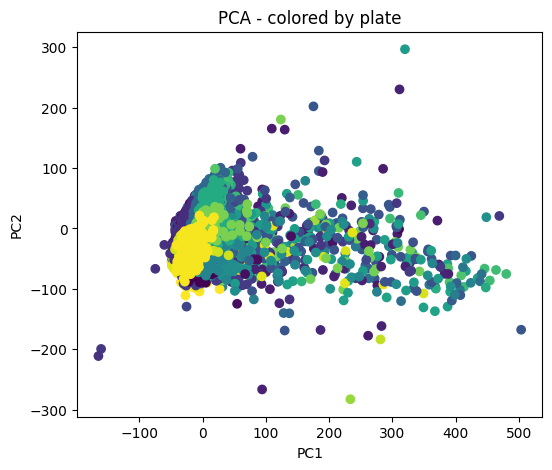

In [ ]:
# Step 5. QC PCA (by plate)
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

pca = PCA(n_components=2)
pcs = pca.fit_transform(features_scaled)

plt.figure(figsize=(6,5))
plt.scatter(pcs[:,0], pcs[:,1], c=meta["Metadata_Plate"].astype('category').cat.codes)
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.title("PCA - colored by plate")
plt.show()

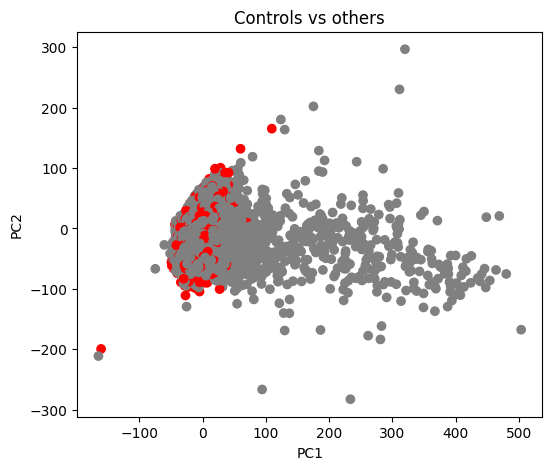

In [ ]:
# Step 6. QC PCA for control (control vs. others)
control_mask = meta["Metadata_Compound"].str.contains("DMSO", na=False)

plt.figure(figsize=(6,5))
plt.scatter(pcs[:,0], pcs[:,1], c=control_mask.map({True:"red", False:"gray"}))
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.title("Controls vs others")
plt.show()

# 4) Plate normalization & Feature slection & Replicate aggregation

In [ ]:
!pip install pycytominer

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.6/81.6 kB 5.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.9/115.9 kB 8.3 MB/s eta 0:00:00


In [ ]:
from pycytominer import normalize

feature_cols = [col for col in df_clean.columns if not col.startswith("Metadata")]
meta_cols = [col for col in df_clean.columns if col.startswith("Metadata")]

# float64 -> float32 due to RAM issue
df_clean[feature_cols] = df_clean[feature_cols].astype("float32")

In [ ]:
dfs = []
for plate, df_plate in df_clean.groupby("Metadata_Plate"):
    df_norm = normalize(
        profiles=df_plate,
        features=feature_cols,
        meta_features=meta_cols,
        samples="Metadata_Compound == 'DMSO'",
        method="mad_robustize"
    )
    dfs.append(df_norm)

df_normalized = pd.concat(dfs).reset_index(drop=True)

# del df_clean
# gc.collect()

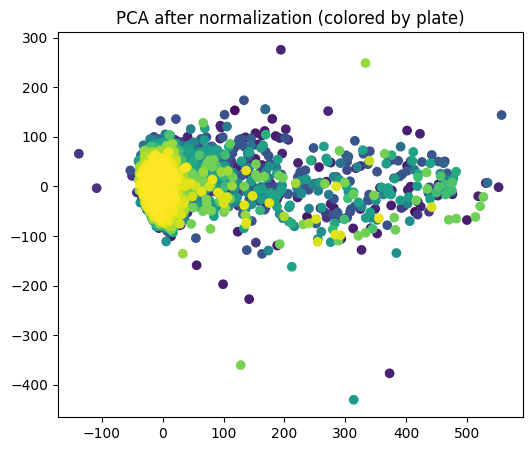

In [ ]:
# PCA after normalization (by plate)
# extract only features
features = df_normalized[feature_cols]

# scaling (optional but recommended for PCA)
scaler = StandardScaler()
features_scaled = scaler.fit_transform(features)

# PCA
pca = PCA(n_components=2)
pcs = pca.fit_transform(features_scaled)

# plot
plt.figure(figsize=(6,5))
plt.scatter(pcs[:,0], pcs[:,1],
            c=df_normalized["Metadata_Plate"].astype('category').cat.codes)
plt.title("PCA after normalization (colored by plate)")
plt.show()

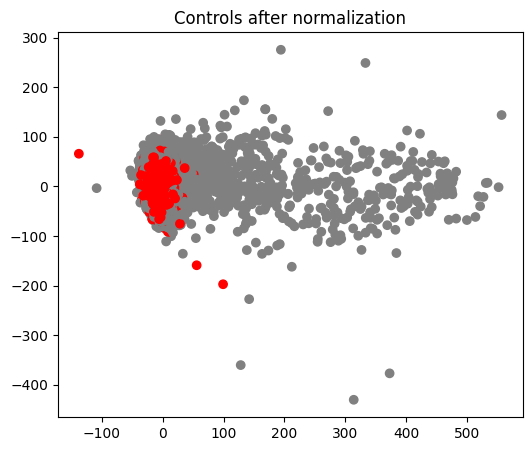

In [ ]:
# PCA after normalization (control vs. others)
control_mask = df_normalized["Metadata_Compound"] == "DMSO"

plt.figure(figsize=(6,5))
plt.scatter(pcs[:,0], pcs[:,1],
            c=control_mask.map({True:"red", False:"gray"}))
plt.title("Controls after normalization")
plt.show()

In [ ]:
# Feature selection
from pycytominer import feature_select

df_feature_selected = feature_select(
    profiles=df_normalized,
    features=feature_cols,
    operation=[
        "variance_threshold", # remove low variance features
        "correlation_threshold",  # remove highly correlated features
        "drop_na_columns",  # remove features with many NaNs
        "drop_outliers",  # remove outliers
        "blocklist" # remove noise features in cellprofiler
    ],
    outlier_cutoff=500,      # drop_outliers criteria (value after normalization > 500 -> outliers)
    corr_threshold=0.9,      # correlation coefficient >= 0.9 -> redundant feature
    na_cutoff=0.05           # NaN > 5% features -> remove
)

print(f"Before feature selection: {len(feature_cols)} features")
print(f"After feature selection: {df_feature_selected.shape[1] - len(meta_cols)} features")

# Redefine feature_cols after feature selection
feature_cols_selected = [col for col in df_feature_selected.columns if not col.startswith("Metadata")]

# del df_normalized
# gc.collect()

Before feature selection: 5640 features
After feature selection: 780 features


In [ ]:
# Aggregate replicates and create consensus
from pycytominer import consensus

df_consensus = consensus(
    profiles=df_feature_selected,
    replicate_columns=["Metadata_Compound", "Metadata_Concentration"],
    operation="median",
    features=feature_cols_selected,
)

print(df_consensus.shape)
display(df_consensus.head())

# del df_feature_selected
# gc.collect()

(8569, 782)


,Metadata_Compound,Metadata_Concentration,Image_Granularity_10_AGP,Image_Granularity_10_Brightfield,Image_Granularity_10_DNA,Image_Granularity_10_ER,Image_Granularity_10_Mito,Image_Granularity_10_RNA,Image_Granularity_11_AGP,Image_Granularity_11_Brightfield,...,Nuclei_Texture_InfoMeas1_ER_10_02_256,Nuclei_Texture_InfoMeas1_Mito_5_00_256,Nuclei_Texture_InfoMeas1_RNA_10_02_256,Nuclei_Texture_InfoMeas1_RNA_3_02_256,Nuclei_Texture_InfoMeas2_AGP_3_00_256,Nuclei_Texture_InfoMeas2_DNA_3_02_256,Nuclei_Texture_InfoMeas2_ER_3_00_256,Nuclei_Texture_InverseDifferenceMoment_DNA_3_00_256,Nuclei_Texture_SumAverage_Brightfield_10_03_256,Nuclei_Texture_SumVariance_RNA_10_03_256
0,(2r)-2-(4-Chloro-2-methylphenoxy)propanoic acid,0.045643,-0.915692,-0.349851,-0.038241,-1.146210,0.125048,0.250717,-0.284360,-0.822638,...,0.526857,0.814512,0.854123,0.923137,-0.614012,-0.586980,-0.443391,-0.293361,-0.075846,-1.304829
1,(2r)-2-(4-Chloro-2-methylphenoxy)propanoic acid,0.136929,0.033323,0.781216,-0.263489,0.342567,1.088278,-0.049223,-0.240844,0.750455,...,-0.216960,0.586608,-0.231116,0.051830,-1.215693,1.339076,1.837975,0.875018,1.945576,9.636970
2,(2r)-2-(4-Chloro-2-methylphenoxy)propanoic acid,0.410788,-0.858940,-0.127691,0.734362,0.118642,-0.726965,-0.264498,-1.353993,0.790119,...,0.369586,0.154912,0.553301,1.885898,0.310337,-1.235543,-0.596906,-0.595732,0.811511,-0.948579
3,(2r)-2-(4-Chloro-2-methylphenoxy)propanoic acid,1.000000,0.034361,1.570611,0.172027,1.334091,0.722806,-0.855425,0.321415,0.745304,...,-0.685796,-0.206982,-0.667328,-0.583024,-0.964759,-0.016288,-0.867301,1.151314,1.282091,-0.440904
4,(2r)-2-(4-Chloro-2-methylphenoxy)propanoic acid,3.500000,2.149084,-0.149451,0.368415,-0.438354,1.118194,1.671560,1.219514,-0.543109,...,-0.894068,-0.966342,-0.134566,-0.305520,1.218805,-0.755769,0.368873,-0.375962,0.195732,1.424712


In [ ]:
from google.colab import drive
import os

drive.mount('/content/drive')
os.makedirs('/content/drive/MyDrive/cell_painting', exist_ok=True)

# parquet format recommended (faster and lighter than csv)
df_normalized.to_parquet('/content/drive/MyDrive/cell_painting/df_normalized.parquet', index=False)
df_feature_selected.to_parquet('/content/drive/MyDrive/cell_painting/df_feature_selected.parquet', index=False)
df_consensus.to_parquet('/content/drive/MyDrive/cell_painting/df_consensus.parquet', index=False)

print("Saved")

Mounted at /content/drive
저장 완료


# 5) Downstream analysis

In [ ]:
# 1. Drive mount
import numpy as np
import pandas as pd
from google.colab import drive
drive.mount('/content/drive')

# 2. Load saved df: df_feature_selected
df_feature_selected = pd.read_parquet('/content/drive/MyDrive/cell_painting/df_feature_selected.parquet')

# 3. Redefine feature_cols
meta_cols = [col for col in df_feature_selected.columns if col.startswith("Metadata")]
feature_cols = [col for col in df_feature_selected.columns if not col.startswith("Metadata")]

Mounted at /content/drive


In [ ]:
# check DMSO
df_feature_selected[df_feature_selected['Metadata_Compound']=="DMSO"]

,Metadata_well_id,Metadata_source,Metadata_Plate,Metadata_Concentration,Metadata_Compound,Metadata_compound_target,Metadata_compound_pathway,Metadata_compound_research_area,Metadata_compound_clinical_information,Metadata_Well,...,Nuclei_Texture_InfoMeas1_ER_10_02_256,Nuclei_Texture_InfoMeas1_Mito_5_00_256,Nuclei_Texture_InfoMeas1_RNA_10_02_256,Nuclei_Texture_InfoMeas1_RNA_3_02_256,Nuclei_Texture_InfoMeas2_AGP_3_00_256,Nuclei_Texture_InfoMeas2_DNA_3_02_256,Nuclei_Texture_InfoMeas2_ER_3_00_256,Nuclei_Texture_InverseDifferenceMoment_DNA_3_00_256,Nuclei_Texture_SumAverage_Brightfield_10_03_256,Nuclei_Texture_SumVariance_RNA_10_03_256
0,assayworks_prod_25_p=plate_41002687_r=0_c=0,assayworks_prod_25,plate_41002687,0.0,DMSO,None,None,None,None,A01,...,0.539469,-1.567263,-0.058855,0.790683,1.858793,1.935683,2.253797,-1.697071,2.845003,4.012221
1,assayworks_prod_25_p=plate_41002687_r=0_c=3,assayworks_prod_25,plate_41002687,0.0,DMSO,None,None,None,None,A04,...,-0.420406,-0.674491,-0.538976,-0.585871,1.139767,0.828885,1.626899,0.123430,1.285421,1.150347
2,assayworks_prod_25_p=plate_41002687_r=0_c=7,assayworks_prod_25,plate_41002687,0.0,DMSO,None,None,None,None,A08,...,-0.780052,0.012053,-0.796071,-0.477558,0.969986,0.633927,1.140858,-0.425230,1.327160,1.762700
3,assayworks_prod_25_p=plate_41002687_r=0_c=8,assayworks_prod_25,plate_41002687,0.0,DMSO,None,None,None,None,A09,...,1.830758,1.798491,1.506956,1.970308,0.128499,0.562479,0.729693,0.129212,0.811096,-0.899854
4,assayworks_prod_25_p=plate_41002687_r=0_c=10,assayworks_prod_25,plate_41002687,0.0,DMSO,None,None,None,None,A11,...,-0.138090,2.093105,-1.282386,0.448025,0.005104,1.320522,-0.190356,2.283342,-0.306416,-0.153973
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21028,assayworks_prod_30_p=plate_41002960_r=15_c=12,assayworks_prod_30,plate_41002960,0.0,DMSO,None,None,None,None,P13,...,0.647346,-0.248424,0.183954,0.159145,-0.557570,0.440422,0.259626,1.834082,1.419975,0.490289
21029,assayworks_prod_30_p=plate_41002960_r=15_c=20,assayworks_prod_30,plate_41002960,0.0,DMSO,None,None,None,None,P21,...,1.435727,0.958980,0.645293,-0.214170,-2.052436,1.149671,0.465098,2.029729,2.478300,-0.661133
21030,assayworks_prod_30_p=plate_41002960_r=15_c=21,assayworks_prod_30,plate_41002960,0.0,DMSO,None,None,None,None,P22,...,0.991968,0.516445,0.966477,1.552748,-2.135372,1.375583,1.204359,1.447252,1.042794,-0.066159
21031,assayworks_prod_30_p=plate_41002960_r=15_c=22,assayworks_prod_30,plate_41002960,0.0,DMSO,None,None,None,None,P23,...,0.683933,0.570760,-0.224828,1.488792,-1.785634,1.552623,-0.231717,2.955255,1.087169,0.030500


The number of DMSO wells: 4849
The number of compound wells: 16184

Threshold (99th percentile of DMSO): 37.49
DMSO distance median: 27.23
DMSO distance 95th percentile: 33.12
DMSO distance 99th percentile: 37.49

The number of total compounds: 1000
Hit count (based on max conc.): 493
Hit rate (based on max conc.): 49.3%


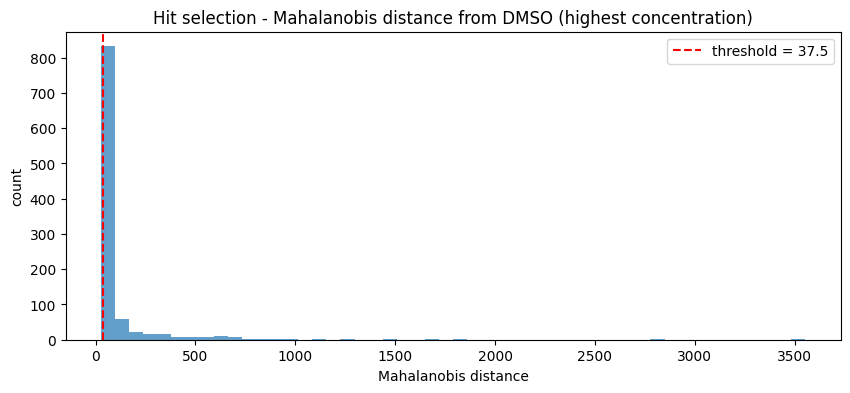

In [ ]:
# Hit selection based on Mahalanobis distance
from scipy.spatial.distance import mahalanobis
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# 1. Seperate DMSO / compound
dmso = df_feature_selected[df_feature_selected["Metadata_Compound"] == "DMSO"]
compounds = df_feature_selected[df_feature_selected["Metadata_Compound"] != "DMSO"].copy()

print(f"The number of DMSO wells: {len(dmso)}")
print(f"The number of compound wells: {len(compounds)}")

# 2. Calculate DMSO reference values: Mean / Covariance / Inverse Covariance
dmso_features = dmso[feature_cols].values.astype(np.float64)
mean_dmso = dmso_features.mean(axis=0)
cov_dmso = np.cov(dmso_features.T)
cov_inv = np.linalg.pinv(cov_dmso) # Inverse Covariance (using pseudo-inverse to prevent singularity)

# 3. Create function for calculating the Mahalanobis distance for each compound well (using matrix operations: fater than loop with mahalanobis())
def mahalanobis_matrix(X, mean, cov_inv):
    diff = X - mean
    left = diff @ cov_inv
    distances = np.sqrt((left * diff).sum(axis=1))
    return distances

# 4. Set the threshold for hit selection based on the DMSO self-distance
dmso_distances = mahalanobis_matrix(dmso_features, mean_dmso, cov_inv)
threshold = np.percentile(dmso_distances, 99) # Empirical percentile (95th/99th percentile of DMSO distribution)
print(f"\nThreshold (99th percentile of DMSO): {threshold:.2f}")
print(f"DMSO distance median: {np.median(dmso_distances):.2f}")
print(f"DMSO distance 95th percentile: {np.percentile(dmso_distances, 95):.2f}")
print(f"DMSO distance 99th percentile: {np.percentile(dmso_distances, 99):.2f}")

# 5. Select only max conc. (hit selection only based on the max conc.)
max_conc = compounds["Metadata_Concentration"].max()
df_top = compounds[compounds["Metadata_Concentration"] == max_conc].copy()

top_distances = mahalanobis_matrix(
    df_top[feature_cols].values.astype(np.float64),
    mean_dmso, cov_inv
)
df_top["Mahalanobis_distance"] = top_distances

# 6. Combine replicates based on median
df_top_median = df_top.groupby(
    "Metadata_Compound"
)["Mahalanobis_distance"].median().reset_index()

# 7. Hit selection
df_top_median["is_hit"] = df_top_median["Mahalanobis_distance"] > threshold
hits = df_top_median[df_top_median["is_hit"]]["Metadata_Compound"].tolist()

print(f"\nThe number of total compounds: {len(df_top_median)}")
print(f"Hit count (based on max conc.): {len(hits)}")
print(f"Hit rate (based on max conc.): {len(hits)/len(df_top_median):.1%}")

# 8. Visualization
plt.figure(figsize=(10, 4))
plt.hist(df_top_median["Mahalanobis_distance"], bins=50, alpha=0.7)
plt.axvline(x=threshold, color='r', linestyle='--',
            label=f'threshold = {threshold:.1f}')
plt.xlabel("Mahalanobis distance")
plt.ylabel("count")
plt.title("Hit selection - Mahalanobis distance from DMSO (highest concentration)")
plt.legend()
plt.show()

In [ ]:
# Calculate Mahalanobis distance for hit compounds & all concentration (for dose response curves)
# 1. Calculate Mahalanobis distance
df_hits_all = compounds[compounds["Metadata_Compound"].isin(hits)].copy()

hit_distances = mahalanobis_matrix(
    df_hits_all[feature_cols].values.astype(np.float64),
    mean_dmso, cov_inv
)
df_hits_all["Mahalanobis_distance"] = hit_distances

# Keep all replicates (no aggregation)
df_dose_response = df_hits_all[["Metadata_Compound", "Metadata_Concentration", "Mahalanobis_distance"]].copy()

# 2. DMSO anchor for fitting stability
lowest_conc = df_dose_response["Metadata_Concentration"].min()
anchor_conc = lowest_conc / 100  # take 1/100 of the lowest con. as dmso conc

# Add DMSO anchor for each compound
dmso_anchor_rows = []
for compound in hits:
    for d in dmso_distances:  # all DMSO replicate (keep replicate variability)
        dmso_anchor_rows.append({
            "Metadata_Compound": compound,
            "Metadata_Concentration": anchor_conc,
            "Mahalanobis_distance": d
        })

df_dmso_anchor = pd.DataFrame(dmso_anchor_rows)
df_dose_response = pd.concat([df_dose_response, df_dmso_anchor], ignore_index=True)

print(f"\nThe number of compounds for dose-response analysis:")
print(f"The number of hit compounds: {len(hits)}")
print(f"The number of test concentrations: {df_dose_response['Metadata_Concentration'].nunique()}")
print(f"Total data points (replicates included): {len(df_dose_response)}")
print(df_dose_response.head(16))


The number of compounds for dose-response analysis:
The number of hit compounds: 493
The number of test concentrations: 9
Total data points (replicates included): 2398010
             Metadata_Compound  Metadata_Concentration  Mahalanobis_distance
0              Oxyphenbutazone                     3.5             47.968161
1            Compound_eeba57fe                     3.5             37.686372
2                   Diclofenac                     3.5             37.959463
3              Levomepromazine                     3.5             34.524080
4   Pitolisant (hydrochloride)                     3.5             34.939515
5             β-Naphthoflavone                     3.5             33.883426
6                 Temsirolimus                     3.5             62.208140
7                    Dasatinib                     3.5            457.238182
8            Compound_d60a93f5                     3.5             34.487641
9    Isavuconazonium (sulfate)                     3.5    

In [ ]:
# Dose response curve - (1) Cell Painting BMC/PoD

from scipy.optimize import curve_fit
from scipy.stats import f as f_dist
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import warnings

# 1. Define Hill model (4-parameter logistic)
def hill_model(x, bottom, top, ec50, hill):
    """
    bottom: lowest values (distance at lowest concentration)
    top: max values
    ec50: 50% effect concentration
    hill: Hill coefficient (curve steepness)
    """
    return bottom + (top - bottom) / (1 + (ec50 / x) ** hill)

# 2. curve fitting + PoD/BMC calcuation for each compound
results = []

for compound, df_compound in df_dose_response.groupby("Metadata_Compound"):
    conc = df_compound["Metadata_Concentration"].values
    dist = df_compound["Mahalanobis_distance"].values

    # sort - ascending conc.
    sort_idx = np.argsort(conc)
    conc = conc[sort_idx]
    dist = dist[sort_idx]

    try:
        # set initial values
        p0 = [
            dist.min(),           # bottom
            dist.max(),           # top
            np.median(conc),      # ec50
            1.0                   # hill
        ]

        # bounds setting
        bounds = (
            [0, 0, conc.min()*0.01, 0.1],
            [np.inf, np.inf, conc.max()*100, 10]
        )

        popt, pcov = curve_fit(
            hill_model, conc, dist,
            p0=p0, bounds=bounds,
            maxfev=10000
        )

        bottom, top, ec50, hill = popt

        # check fitting quality (R²)
        dist_pred = hill_model(conc, *popt)
        ss_res = np.sum((dist - dist_pred) ** 2)
        ss_tot = np.sum((dist - dist.mean()) ** 2)
        r2 = 1 - ss_res / ss_tot

        # calculate BMC (99th percentile)
        bmr = threshold  # DMSO threshold that was calculated above

        # conc. over BMR = BMC
        if top > bmr > bottom:
            bmc = ec50 * ((bmr - bottom) / (top - bmr)) ** (1 / hill)
        else:
            bmc = np.nan

        # treat "PoD = BMC"  (the lowest significant effect conc.)
        pod = bmc

        results.append({
            "Metadata_Compound": compound,
            "bottom": bottom,
            "top": top,
            "ec50": ec50,
            "hill": hill,
            "r2": r2,
            "BMC": bmc,
            "PoD": pod,
            "conc_min": conc.min(),
            "conc_max": conc.max(),
            "fit_success": True
        })

    except Exception as e:
        results.append({
            "Metadata_Compound": compound,
            "r2": np.nan,
            "BMC": np.nan,
            "PoD": np.nan,
            "fit_success": False
        })

df_results = pd.DataFrame(results)

# 3. filtering based on fitting quality
df_results_good = df_results[
    (df_results["fit_success"] == True) &
    (df_results["r2"] > 0.7) &      # R² > 0.7
    (df_results["BMC"].notna()) &
    (df_results["BMC"] >= df_results["conc_min"]) &  # within test conc. range
    (df_results["BMC"] <= df_results["conc_max"])
].copy()

print(f"Total hit compounds: {len(df_results)}")
print(f"Successful fitting (R²>0.7): {len(df_results_good)}")
print(f"Fitting fail or out of the range: {len(df_results) - len(df_results_good)}")
print(f"\nTop 20 (lower BMC = more potent):")
print(df_results_good.sort_values("BMC")[["Metadata_Compound", "BMC", "PoD", "r2"]].head(20))

Total hit compounds: 493
Successful fitting (R²>0.7): 72
Fitting fail or out of the range: 421

Top 20 (lower BMC = more potent):
             Metadata_Compound       BMC       PoD        r2
366                 Plicamycin  0.002351  0.002351  0.958709
400                 Romidepsin  0.002539  0.002539  0.750445
181                    Digoxin  0.048054  0.048054  0.940671
167                  Dasatinib  0.065067  0.065067  0.903736
118          Compound_516bb906  1.434432  1.434432  0.979023
370                Pralsetinib  1.462886  1.462886  0.929026
368  Ponatinib (hydrochloride)  1.633922  1.633922  0.995557
376  Puromycin aminonucleoside  1.730183  1.730183  0.905325
62                  Brigatinib  1.845016  1.845016  0.889611
240               Fostamatinib  2.525170  2.525170  0.812096
423                  Sunitinib  2.741306  2.741306  0.992895
204                Encorafenib  3.031903  3.031903  0.759083
41                 Avapritinib  3.928863  3.928863  0.738630
490             

In [ ]:
df_results_good

,Metadata_Compound,bottom,top,ec50,hill,r2,BMC,PoD,conc_min,conc_max,fit_success
6,3-Iodoprop-2-yn-1-yl butylcarbamate,27.728695,1.220955e+03,75.562857,3.631462,0.928548,20.161314,20.161314,0.000456,100.0,True
28,Amiodarone (hydrochloride),27.726378,2.930649e+04,593.428398,2.561785,0.717261,26.071895,26.071895,0.000456,100.0,True
29,Amlodipine,27.731750,2.560486e+03,84.949823,5.292453,0.966722,29.737696,29.737696,0.000456,100.0,True
34,Aripiprazole,27.728921,6.491874e+02,50.842145,6.647623,0.898615,27.282781,27.282781,0.000456,100.0,True
36,Astemizole,27.723102,1.025171e+03,48.150620,2.916162,0.954552,9.887486,9.887486,0.000456,100.0,True
...,...,...,...,...,...,...,...,...,...,...,...
446,Terfenadine,27.732847,4.651178e+03,179.085622,3.283721,0.920128,27.447663,27.447663,0.000456,100.0,True
467,Triamterene,27.723088,4.260838e+03,204.954943,3.323823,0.813082,33.007428,33.007428,0.000456,100.0,True
483,Voclosporin,27.734259,1.094085e+06,7404.178003,1.828161,0.848348,12.800749,12.800749,0.000456,100.0,True
486,Vortioxetine,27.724398,6.590205e+04,1269.251837,1.852684,0.862066,10.884697,10.884697,0.000456,100.0,True


In [ ]:
# Check if df_hits_all has Metadata_Count_Cells
print("Metadata_Count_Cells" in df_hits_all.columns)
print(df_hits_all[["Metadata_Compound", "Metadata_Concentration", "Metadata_Count_Cells"]].head(16))

True
              Metadata_Compound  Metadata_Concentration  Metadata_Count_Cells
160             Oxyphenbutazone                     3.5                   798
161           Compound_eeba57fe                     3.5                   904
162                  Diclofenac                     3.5                   883
167             Levomepromazine                     3.5                   853
168  Pitolisant (hydrochloride)                     3.5                   819
169            β-Naphthoflavone                     3.5                   925
172                Temsirolimus                     3.5                   814
174                   Dasatinib                     3.5                   400
176           Compound_d60a93f5                     3.5                   827
185   Isavuconazonium (sulfate)                     3.5                   920
188                  Dofetilide                     3.5                   859
192                Vortioxetine                     3.5    

In [ ]:
# Dose response curve - (2) Cytotoxicity BMC based on cell count
# 1. Calculate based on DMSO cell count
dmso_cell_count = dmso["Metadata_Count_Cells"].values

dmso_cc_mean = dmso_cell_count.mean()
dmso_cc_std = dmso_cell_count.std()

print(f"DMSO cell count mean: {dmso_cc_mean:.1f}")
print(f"DMSO cell count std: {dmso_cc_std:.1f}")

# 2. Keep all replicates (no aggregation) - hit compounds
df_cc_dose_response = df_hits_all[["Metadata_Compound", "Metadata_Concentration", "Metadata_Count_Cells"]].copy()

# add DMSO (conc.: 1/100 of the lowest) - keep replicates
dmso_cc = dmso[["Metadata_Compound", "Metadata_Count_Cells"]].copy()

lowest_conc = df_hits_all["Metadata_Concentration"].min()
anchor_conc = lowest_conc / 100
dmso_cc["Metadata_Concentration"] = anchor_conc

df_cc_dose_response = pd.concat([
    df_cc_dose_response, dmso_cc
]).reset_index(drop=True)

print(df_cc_dose_response.head(16))

# 3. Hill model for Cell count (cytotoxicity: reduction)
def hill_model_decrease(x, top, bottom, ec50, hill):
    """
    cell count decreases as conc. increases
    top: cell count in DMSO condition
    bottom: the lowest cell count
    """
    return bottom + (top - bottom) / (1 + (x / ec50) ** hill)

# 4. Set BMR - 20% reduction compared to DMSO
bmr_cc = dmso_cc_mean * 0.8  # 80% viability = 20% reduction
print(f"Cell count BMR (80% viability): {bmr_cc:.1f}")

# 5. Curve fitting for each compound
results_cc = []

for compound, df_compound in df_cc_dose_response[
    df_cc_dose_response["Metadata_Compound"] != "DMSO"
].groupby("Metadata_Compound"):

    # Actual conc. except DMSO con.
    df_c = df_compound.copy()
    conc = df_c["Metadata_Concentration"].values
    cc = df_c["Metadata_Count_Cells"].values

    sort_idx = np.argsort(conc)
    conc = conc[sort_idx]
    cc = cc[sort_idx]

    try:
        p0 = [
            dmso_cc_mean,        # top
            cc.min(),            # bottom
            np.median(conc),     # ec50
            1.0                  # hill
        ]

        bounds = (
            [0, 0, conc.min()*0.01, 0.1],
            [dmso_cc_mean*2, dmso_cc_mean, conc.max()*100, 10]
        )

        popt, _ = curve_fit(
            hill_model_decrease, conc, cc,
            p0=p0, bounds=bounds,
            maxfev=10000
        )

        top, bottom, ec50, hill = popt

        # calculate R²
        cc_pred = hill_model_decrease(conc, *popt)
        ss_res = np.sum((cc - cc_pred) ** 2)
        ss_tot = np.sum((cc - cc.mean()) ** 2)
        r2 = 1 - ss_res / ss_tot if ss_tot > 0 else np.nan

        # calculate BMC (80% viability)
        if bottom < bmr_cc < top:
            bmc_cc = ec50 * ((top - bmr_cc) / (bmr_cc - bottom)) ** (1 / hill)
        else:
            bmc_cc = np.nan

        results_cc.append({
            "Metadata_Compound": compound,
            "top": top,
            "bottom": bottom,
            "ec50_cc": ec50,
            "hill_cc": hill,
            "r2_cc": r2,
            "BMC_cc": bmc_cc,
            "conc_min": conc.min(),
            "conc_max": conc.max(),
            "fit_success": True
        })

    except Exception:
        results_cc.append({
            "Metadata_Compound": compound,
            "r2_cc": np.nan,
            "BMC_cc": np.nan,
            "fit_success": False
        })

df_results_cc = pd.DataFrame(results_cc)

# 6. Filtering
df_results_cc_good = df_results_cc[
    (df_results_cc["fit_success"] == True) &
    (df_results_cc["r2_cc"] > 0.7) &
    (df_results_cc["BMC_cc"].notna()) &
    (df_results_cc["BMC_cc"] >= df_results_cc["conc_min"]) &
    (df_results_cc["BMC_cc"] <= df_results_cc["conc_max"])
].copy()

print(f"Total hit compound: {len(df_results_cc)}")
print(f"Successful fitting (R²>0.7): {len(df_results_cc_good)}")
print(f"\nTop 20 (lower BMC = more cytotoxic):")
print(df_results_cc_good.sort_values("BMC_cc")[
    ["Metadata_Compound", "BMC_cc", "r2_cc"]
].head(20))

# 7. Compare Morphological BMC vs Cell count BMC
df_compare = df_results_good[["Metadata_Compound", "BMC", "r2"]].merge(
    df_results_cc_good[["Metadata_Compound", "BMC_cc", "r2_cc"]],
    on="Metadata_Compound",
    how="inner"
)

print(f"\nCompounds with both BMC: {len(df_compare)}")

DMSO cell count mean: 774.9
DMSO cell count std: 95.7
             Metadata_Compound  Metadata_Concentration  Metadata_Count_Cells
0              Oxyphenbutazone                     3.5                   798
1            Compound_eeba57fe                     3.5                   904
2                   Diclofenac                     3.5                   883
3              Levomepromazine                     3.5                   853
4   Pitolisant (hydrochloride)                     3.5                   819
5             β-Naphthoflavone                     3.5                   925
6                 Temsirolimus                     3.5                   814
7                    Dasatinib                     3.5                   400
8            Compound_d60a93f5                     3.5                   827
9    Isavuconazonium (sulfate)                     3.5                   920
10                  Dofetilide                     3.5                   859
11                Vort

In [ ]:
# 1. Drive mount
from google.colab import drive
drive.mount('/content/drive')

# 2. Load df: df_consensus
import pandas as pd
df_consensus = pd.read_parquet('/content/drive/MyDrive/cell_painting/df_consensus.parquet')

# 3. Redefine feature_cols
meta_cols = [col for col in df_consensus.columns if col.startswith("Metadata")]
feature_cols = [col for col in df_consensus.columns if not col.startswith("Metadata")]

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
df_consensus

,Metadata_Compound,Metadata_Concentration,Image_Granularity_10_AGP,Image_Granularity_10_Brightfield,Image_Granularity_10_DNA,Image_Granularity_10_ER,Image_Granularity_10_Mito,Image_Granularity_10_RNA,Image_Granularity_11_AGP,Image_Granularity_11_Brightfield,...,Nuclei_Texture_InfoMeas1_ER_10_02_256,Nuclei_Texture_InfoMeas1_Mito_5_00_256,Nuclei_Texture_InfoMeas1_RNA_10_02_256,Nuclei_Texture_InfoMeas1_RNA_3_02_256,Nuclei_Texture_InfoMeas2_AGP_3_00_256,Nuclei_Texture_InfoMeas2_DNA_3_02_256,Nuclei_Texture_InfoMeas2_ER_3_00_256,Nuclei_Texture_InverseDifferenceMoment_DNA_3_00_256,Nuclei_Texture_SumAverage_Brightfield_10_03_256,Nuclei_Texture_SumVariance_RNA_10_03_256
0,(2r)-2-(4-Chloro-2-methylphenoxy)propanoic acid,0.045643,-0.915692,-0.349851,-0.038241,-1.146210,0.125048,0.250717,-0.284360,-0.822638,...,0.526857,0.814512,0.854123,0.923137,-0.614012,-0.586980,-0.443391,-0.293361,-0.075846,-1.304829
1,(2r)-2-(4-Chloro-2-methylphenoxy)propanoic acid,0.136929,0.033323,0.781216,-0.263489,0.342567,1.088278,-0.049223,-0.240844,0.750455,...,-0.216960,0.586608,-0.231116,0.051830,-1.215693,1.339076,1.837975,0.875018,1.945576,9.636970
2,(2r)-2-(4-Chloro-2-methylphenoxy)propanoic acid,0.410788,-0.858940,-0.127691,0.734362,0.118642,-0.726965,-0.264498,-1.353993,0.790119,...,0.369586,0.154912,0.553301,1.885898,0.310337,-1.235543,-0.596906,-0.595732,0.811511,-0.948579
3,(2r)-2-(4-Chloro-2-methylphenoxy)propanoic acid,1.000000,0.034361,1.570611,0.172027,1.334091,0.722806,-0.855425,0.321415,0.745304,...,-0.685796,-0.206982,-0.667328,-0.583024,-0.964759,-0.016288,-0.867301,1.151314,1.282091,-0.440904
4,(2r)-2-(4-Chloro-2-methylphenoxy)propanoic acid,3.500000,2.149084,-0.149451,0.368415,-0.438354,1.118194,1.671560,1.219514,-0.543109,...,-0.894068,-0.966342,-0.134566,-0.305520,1.218805,-0.755769,0.368873,-0.375962,0.195732,1.424712
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8564,β-Naphthoflavone,1.000000,1.649263,1.141053,-0.106098,1.054443,0.613170,0.574472,0.174480,-0.417374,...,-1.851450,-1.538099,-1.265934,-1.271947,0.803341,0.627600,0.544678,0.625001,-0.793693,0.934714
8565,β-Naphthoflavone,3.500000,1.672238,-0.718095,-1.797674,0.389264,2.035887,1.887972,1.332414,-0.184148,...,-0.788422,-0.429268,-1.837706,-0.785548,1.053062,1.015482,1.200480,2.008119,2.368443,1.478979
8566,β-Naphthoflavone,11.000000,-0.938699,0.300440,-0.675083,0.312023,-0.221456,-0.093521,-0.339334,-1.376785,...,1.063044,1.399671,0.362580,-0.137396,-0.639906,-0.457944,1.494677,-1.647736,-0.814326,0.624063
8567,β-Naphthoflavone,33.500000,1.745671,0.976406,-0.620648,0.006086,0.072717,-0.621967,1.845765,0.516089,...,-0.097703,1.242677,-0.362227,0.363678,0.355034,-0.199025,1.875251,0.616094,2.191578,1.242087


In [ ]:
df_consensus['Metadata_Compound'].nunique()

1086

Max conc.: 100.0
The number of wells: 1000


/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


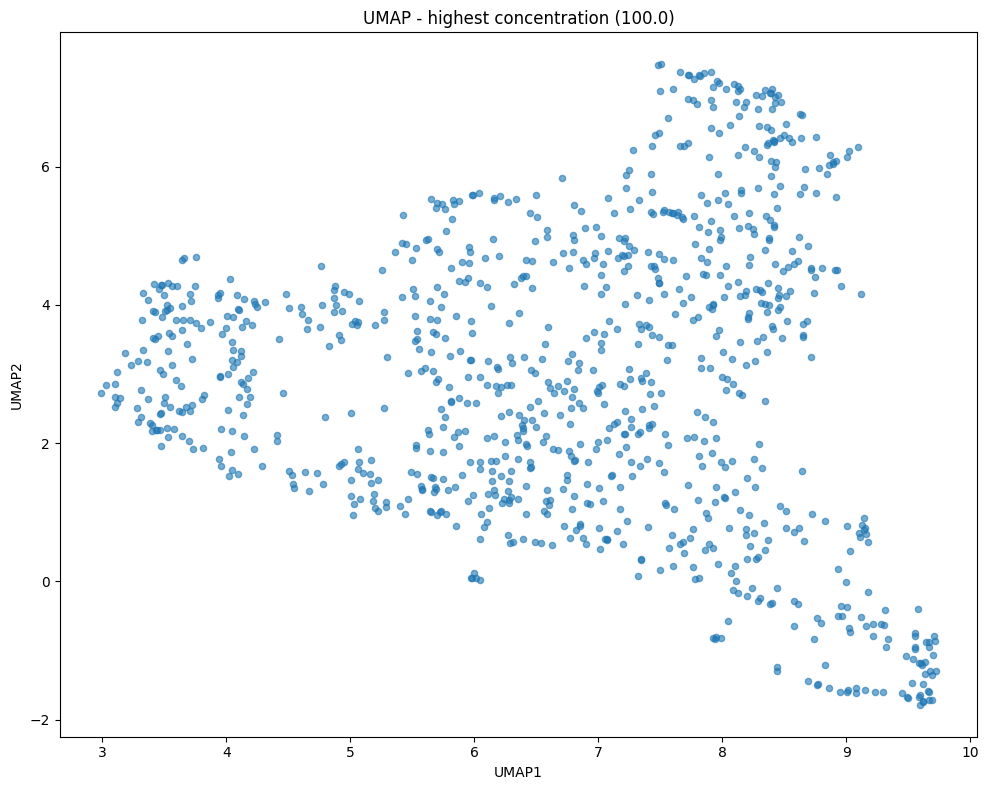

In [ ]:
# UMAP using the highest concentration
import umap
import matplotlib.pyplot as plt
import numpy as np

# 1. Extract max conc. rows
max_conc = df_consensus["Metadata_Concentration"].max()
df_top_consensus = df_consensus[df_consensus["Metadata_Concentration"] == max_conc].copy()

print(f"Max conc.: {max_conc}")
print(f"The number of wells: {len(df_top_consensus)}")

# 2. Redefine feature_cols (based on df_consensus)
feature_cols = [col for col in df_consensus.columns if not col.startswith("Metadata")]

# 3. UMAP
reducer = umap.UMAP(     # What does it do? Explain connections: In a high-dimensional space, the "n nearest neighbors" are identified for each point to establish connections between the points.
    n_components=2,      # How many dimensions to compress to
    n_neighbors=15,      # The number of neighboring points each point references to discern the underlying structure (smaller values ​​emphasize local structure; larger values ​​emphasize global structure): e.g. 1,000 substances -> 15 to 30 recommended
    min_dist=0.1,        # How closely points can be packed together in a compressed space (the smaller the value, the denser the cluster; the larger the value, the more evenly the points are distributed): typically between 0.05 and 0.3.
    metric="cosine",     # How to measure the distance between points: In Cell Painting, cosine similarity is frequently used (measuring the difference in vector direction); cf. euclidean: absolute distance
    random_state = 42)

embedding = reducer.fit_transform(df_top_consensus[feature_cols])

# 4. Visualization
plt.figure(figsize=(10, 8))
scatter = plt.scatter(
    embedding[:, 0], embedding[:, 1],
    alpha=0.6,
    s=20
)
plt.title(f"UMAP - highest concentration ({max_conc})")
plt.xlabel("UMAP1")
plt.ylabel("UMAP2")
plt.tight_layout()
plt.show()

Total number of compounds (df_top_consensus): 1000
hit count: 493
non-hit count: 507


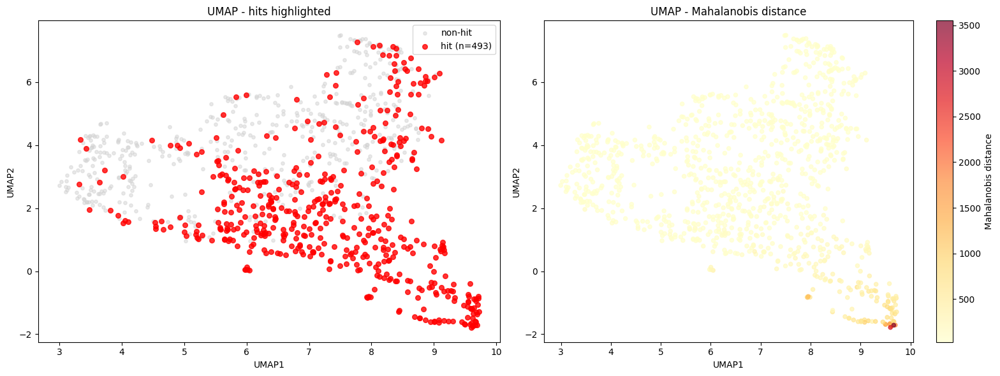

In [ ]:
# UMAP using the highest concentration - hit vs. non-hit

# 1. Load df_top_consensus (high conc. rows from df_concensus)
df_top_consensus = df_top_consensus.copy().reset_index(drop=True)
print(f"Total number of compounds (df_top_consensus): {len(df_top_consensus)}")

# 2. Combine hit info
df_top_consensus = df_top_consensus.merge(
    df_top_median[["Metadata_Compound", "Mahalanobis_distance", "is_hit"]],
    on="Metadata_Compound",
    how="left"
)

df_top_consensus["is_hit"] = df_top_consensus["is_hit"].fillna(False) # DMSO: is_hit NaN → False

print(f"hit count: {df_top_consensus['is_hit'].sum()}")
print(f"non-hit count: {(~df_top_consensus['is_hit']).sum()}")

# 3. Visualize UMAP
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Plot 1: hit / non-hit
hit_mask = df_top_consensus["is_hit"].values

axes[0].scatter(
    embedding[~hit_mask, 0],
    embedding[~hit_mask, 1],
    c="lightgray", s=15, alpha=0.5, label="non-hit"
)
axes[0].scatter(
    embedding[hit_mask, 0],
    embedding[hit_mask, 1],
    c="red", s=30, alpha=0.8,
    label=f"hit (n={hit_mask.sum()})"
)
axes[0].set_title("UMAP - hits highlighted")
axes[0].set_xlabel("UMAP1")
axes[0].set_ylabel("UMAP2")
axes[0].legend()

# Plot 2: Mahalanobis distance gradient
scatter = axes[1].scatter(
    embedding[:, 0], embedding[:, 1],
    c=df_top_consensus["Mahalanobis_distance"],
    cmap="YlOrRd",
    s=20, alpha=0.7
)
plt.colorbar(scatter, ax=axes[1], label="Mahalanobis distance")
axes[1].set_title("UMAP - Mahalanobis distance")
axes[1].set_xlabel("UMAP1")
axes[1].set_ylabel("UMAP2")

plt.tight_layout()
plt.show()

Hit compound count: 493
Similarity matrix shape: (493, 493)
cluster
1      45
2      69
3      41
4      25
5      67
6      50
7     127
8      25
9      18
10     26
Name: count, dtype: int64


/usr/local/lib/python3.12/dist-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/usr/local/lib/python3.12/dist-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


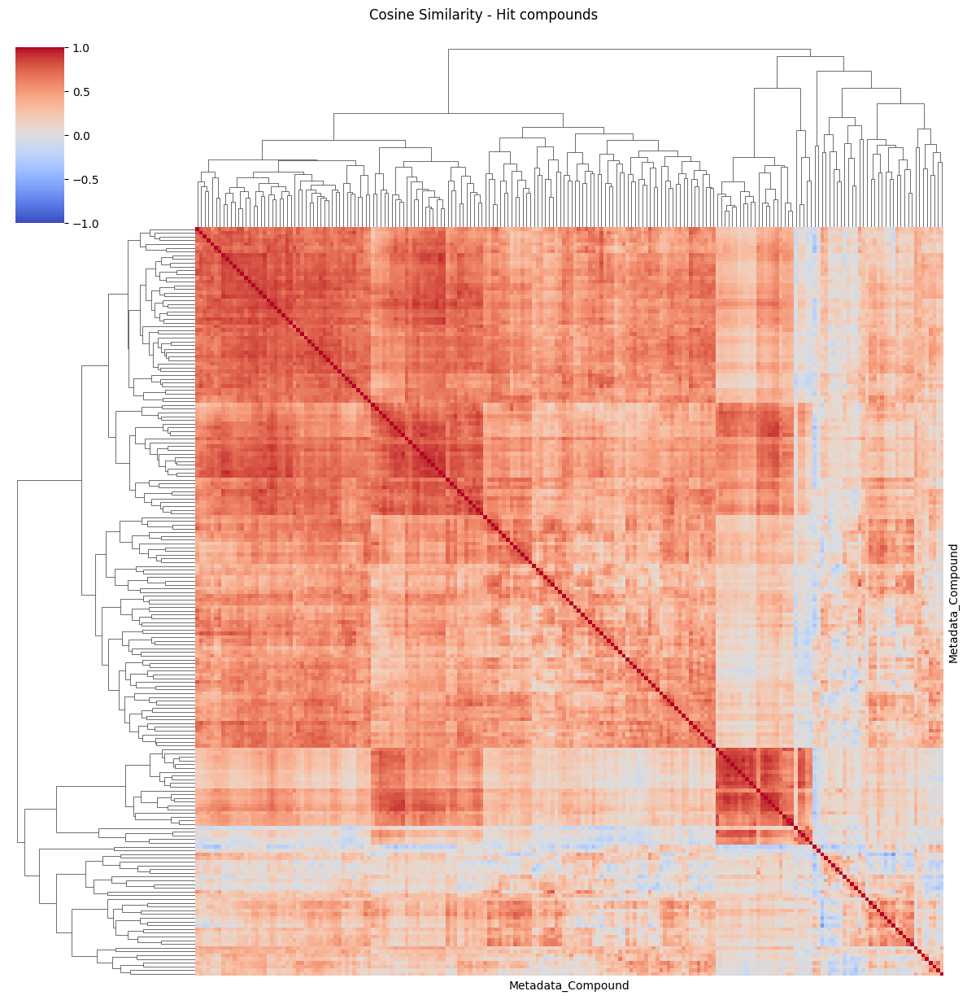

In [ ]:
# Cosine similarity and Clustering
# Cosine Similarity: 두 compound의 feature vector가 얼마나 같은 방향을 가리키는지 측정
# 1) same direction → cosine similarity = 1.0 (possibly similar MoA)
# 2) opposite direction → cosine similarity = -1.0
# 3) no relevance → cosine similarity = 0
from sklearn.metrics.pairwise import cosine_similarity
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
from scipy.spatial.distance import squareform
import seaborn as sns

# 1. Extract hit compounds (high conc. consensus)
hits = df_top_median[df_top_median["is_hit"]]["Metadata_Compound"].tolist()

df_hits_consensus = df_consensus[
    (df_consensus["Metadata_Concentration"] == max_conc) &
    (df_consensus["Metadata_Compound"].isin(hits))
].copy().reset_index(drop=True)

print(f"Hit compound count: {len(df_hits_consensus)}")

# 2. Calculate Cosine similarity matrix
feature_cols_selected = [col for col in df_hits_consensus.columns
                         if not col.startswith("Metadata")]

sim_matrix = cosine_similarity(df_hits_consensus[feature_cols_selected])
sim_df = pd.DataFrame(
    sim_matrix,
    index=df_hits_consensus["Metadata_Compound"],
    columns=df_hits_consensus["Metadata_Compound"]
)

print(f"Similarity matrix shape: {sim_df.shape}")

# 3. Hierarchical clustering
# cosine similarity → turn into distance (1 - similarity)
dist_matrix = 1 - sim_matrix
dist_matrix = np.clip(dist_matrix, 0, 2)  # to prevent errors
np.fill_diagonal(dist_matrix, 0)
# calculate linkage (ward method)
linkage_matrix = linkage(squareform(dist_matrix), method="ward")

# 4. Determine cluster numbers (start with 10 here)
n_clusters = 10
cluster_labels = fcluster(linkage_matrix, n_clusters, criterion="maxclust")
df_hits_consensus["cluster"] = cluster_labels

print(df_hits_consensus["cluster"].value_counts().sort_index())

# 5. Visualize Clustermap
# too many compounds -> too big heatmap -> sampling was done
if len(df_hits_consensus) > 200:
    df_sample = df_hits_consensus.sample(200, random_state=42)
    sim_sample = cosine_similarity(df_sample[feature_cols_selected])
    sim_sample_df = pd.DataFrame(
        sim_sample,
        index=df_sample["Metadata_Compound"],
        columns=df_sample["Metadata_Compound"]
    )
else:
    sim_sample_df = sim_df

sns.clustermap(
    sim_sample_df,
    cmap="coolwarm",
    vmin=-1, vmax=1,
    figsize=(12, 12),
    xticklabels=False,
    yticklabels=False
)
plt.suptitle("Cosine Similarity - Hit compounds", y=1.02)
plt.show()

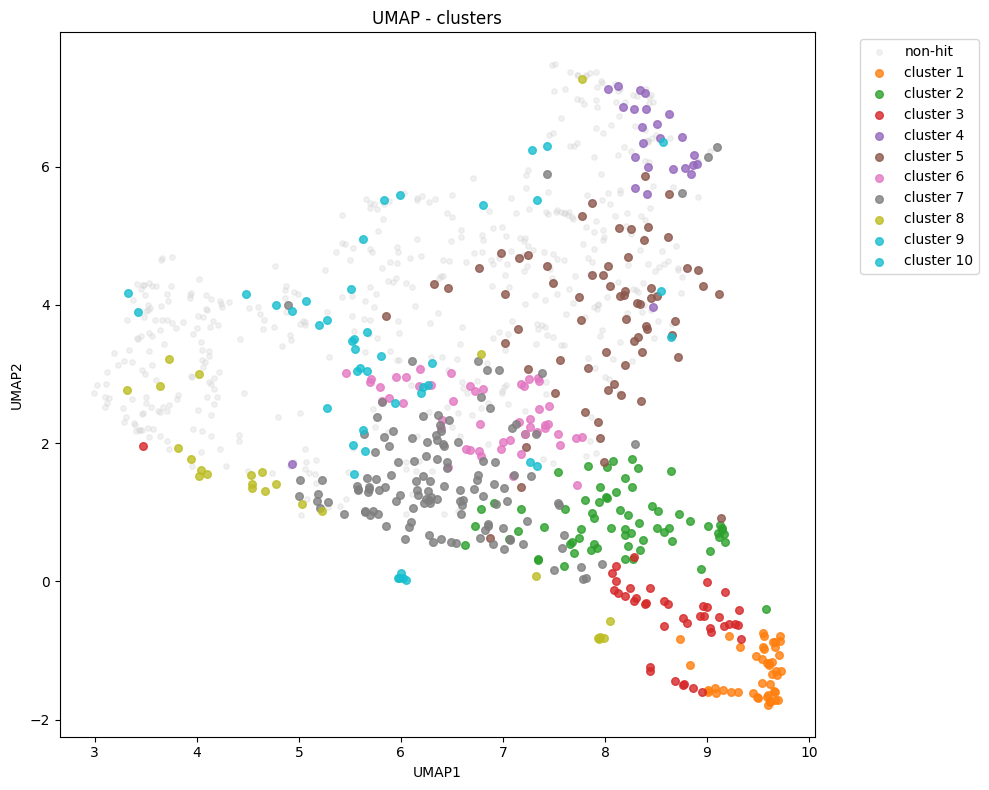

In [ ]:
# UMAP with clusters

# 1. Define dictionary for shared colors (for later plots with cluster info)
all_clusters = sorted(df_hits_consensus["cluster"].unique())
cmap = plt.cm.tab10
shared_colors = {c: cmap(c / 10) for c in range(11)}  # 0~10
shared_colors[0] = "lightgray"  # non-hit

# 2. Add cluster info into df_top_consensus
df_top_consensus = df_top_consensus.merge(
    df_hits_consensus[["Metadata_Compound", "cluster"]],
    on="Metadata_Compound",
    how="left"
)
df_top_consensus["cluster"] = df_top_consensus["cluster"].fillna(0).astype(int)  # 0 = non-hit

fig, ax = plt.subplots(figsize=(10, 8))

for cluster_id in sorted(df_top_consensus["cluster"].unique()):
    mask = df_top_consensus["cluster"].values == cluster_id
    label = f"cluster {cluster_id}" if cluster_id != 0 else "non-hit"
    size = 30 if cluster_id != 0 else 15
    alpha = 0.8 if cluster_id != 0 else 0.3
    ax.scatter(embedding[mask, 0], embedding[mask, 1],
               color=shared_colors[cluster_id],
               s=size, alpha=alpha, label=label)

ax.set_title("UMAP - clusters")
ax.set_xlabel("UMAP1")
ax.set_ylabel("UMAP2")
ax.legend(bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.show()

In [ ]:
# List of compounds in each cluster (first 10)
for cluster_id in sorted(df_hits_consensus["cluster"].unique()):
    compounds_in_cluster = df_hits_consensus[
        df_hits_consensus["cluster"] == cluster_id
    ]["Metadata_Compound"].tolist()
    print(f"\nCluster {cluster_id} (n={len(compounds_in_cluster)}):")
    print(compounds_in_cluster[:10])  #


Cluster 1 (n=45):
['3-Iodoprop-2-yn-1-yl butylcarbamate', 'Amlodipine', 'Aripiprazole', 'Astemizole', 'Azathioprine', 'Azelnidipine', 'Azoxystrobin', 'Baricitinib', 'Benzethonium (chloride)', 'Berotralstat (dihydrochloride)']

Cluster 2 (n=69):
['1H,1H,2H,2H-Perfluoro-1-decanol', 'Acalabrutinib', 'Alpelisib', 'Anidulafungin', 'Apalutamide', 'Apomorphine', 'Atazanavir', 'Betaxolol', 'Citalopram', 'Clozapine']

Cluster 3 (n=41):
['Amiodarone (hydrochloride)', 'Avapritinib', 'Axitinib', 'Baloxavir marboxil', 'Brigatinib', 'Calcifediol', 'Calcitriol', 'Ceritinib', 'Compound_9a411687', 'Compound_a16a83ef']

Cluster 4 (n=25):
['1-Oxindene', '3-Nitropropanoic acid', 'Adenosine', 'Amphotericin B', 'Benznidazole', 'CP-532623', 'Cefotaxime', 'Chlorpyrifos', 'Compound_0cf001d4', 'Compound_232f8ab7']

Cluster 5 (n=67):
['2,2,3,3,4,4,5,5,6,6,7,7,8,8,9,9,9-Heptadecafluorononanoic acid', '2,7-Dihydroxynaphthalene', '4-(tert-Butyl)benzene-1,2-diol', '4-CPA', '4-Nitrophenol', '5-Fluorouracil', '6-Merc

In [ ]:
# Check target/pathway for individual clusters
# 1. Extract columns from df_feature_selected
meta_info = df_feature_selected[["Metadata_Compound", "Metadata_compound_target", "Metadata_compound_pathway"]].drop_duplicates()

# 2. merge with cluster info (df_hits_consensus)
df_hits_annotated = df_hits_consensus[["Metadata_Compound", "cluster"]].merge(
    meta_info,
    on="Metadata_Compound",
    how="left"
)

# 3. print target/pathway for each cluster
for cluster_id in sorted(df_hits_annotated["cluster"].unique()):
    df_c = df_hits_annotated[df_hits_annotated["cluster"] == cluster_id]
    print(f"\nCluster {cluster_id} (n={len(df_c)}):")
    print(df_c[["Metadata_Compound", "Metadata_compound_target", "Metadata_compound_pathway"]].to_string())


Cluster 1 (n=45):
                                  Metadata_Compound                                                Metadata_compound_target                                                                                        Metadata_compound_pathway
6               3-Iodoprop-2-yn-1-yl butylcarbamate                                                                    None                                                                                                             None
29                                       Amlodipine                                                         Calcium Channel                                                             Membrane Transporter/Ion Channel; Neuronal Signaling
34                                     Aripiprazole                                        5-HT Receptor; Dopamine Receptor                                                                               GPCR/G Protein; Neuronal Signaling
36                               

Cluster 1: 45 compounds


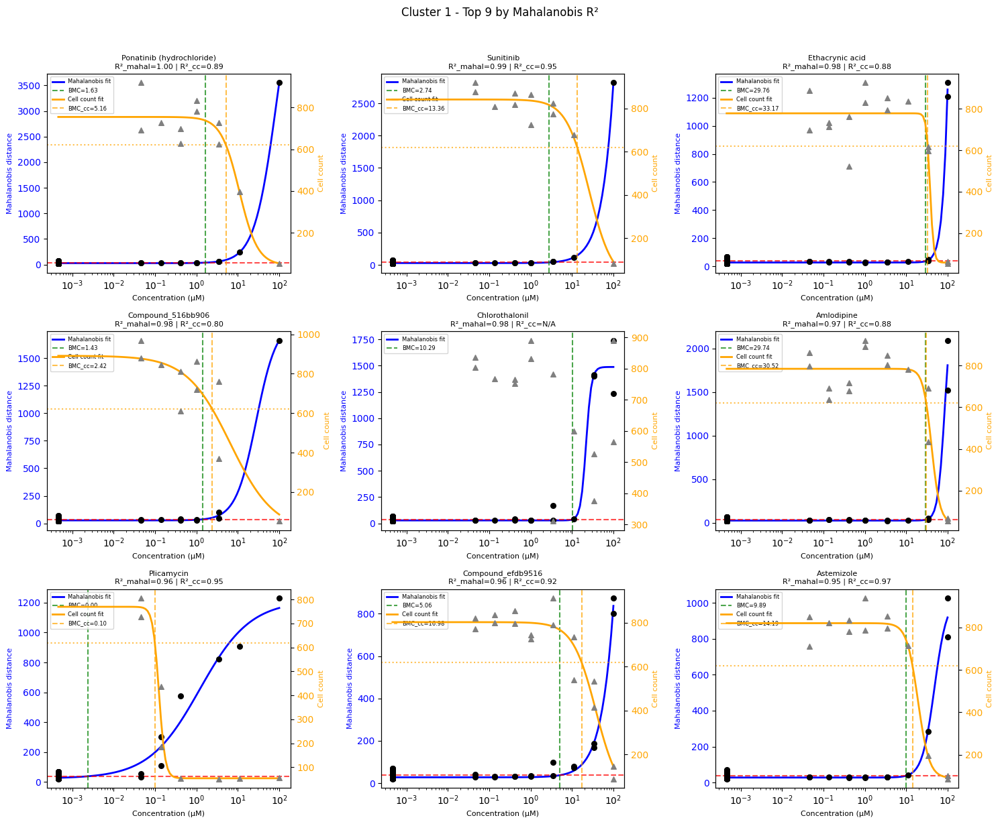

In [ ]:
# Define function for CRCs: plot 9 compounds based on R²
def plot_dose_response_cluster(compound_list, cluster_name):
    # df_results_good, df_results_cc_good: compds with both OR with at least one
    compounds_mahal = df_results_good[
        df_results_good["Metadata_Compound"].isin(compound_list)
    ].sort_values("r2", ascending=False)

    # Select 9 compounds with highest R²
    top_compounds = compounds_mahal.head(9)["Metadata_Compound"].tolist()

    if len(top_compounds) == 0:
        print(f"{cluster_name}: no compounds with successful fitting")
        return

    n = len(top_compounds)
    ncols = 3
    nrows = (n + 2) // 3

    fig, axes = plt.subplots(nrows, ncols, figsize=(15, 4 * nrows))
    axes = np.atleast_1d(axes).flatten()

    conc_range = np.logspace(
        np.log10(df_dose_response["Metadata_Concentration"].min()),
        np.log10(df_dose_response["Metadata_Concentration"].max()),
        100
    )

    for i, compound in enumerate(top_compounds):
        ax1 = axes[i]
        ax2 = ax1.twinx()

        df_c = df_dose_response[df_dose_response["Metadata_Compound"] == compound]
        df_cc = df_cc_dose_response[
            (df_cc_dose_response["Metadata_Compound"] == compound) &
            (df_cc_dose_response["Metadata_Concentration"] > 0)
        ]

        row_mahal = df_results_good[df_results_good["Metadata_Compound"] == compound]
        row_cc = df_results_cc_good[df_results_cc_good["Metadata_Compound"] == compound]

        # Left y-axis: Mahalanobis
        ax1.scatter(df_c["Metadata_Concentration"], df_c["Mahalanobis_distance"],
                    color="black", zorder=5, s=30)

        r2_mahal = np.nan
        if len(row_mahal) > 0:
            r = row_mahal.iloc[0]
            r2_mahal = r["r2"]
            dist_fit = hill_model(conc_range, r["bottom"], r["top"], r["ec50"], r["hill"])
            ax1.plot(conc_range, dist_fit, color="blue", linewidth=2, label="Mahalanobis fit")
            ax1.axhline(y=threshold, color="red", linestyle="--", alpha=0.7)
            if not np.isnan(r["BMC"]):
                ax1.axvline(x=r["BMC"], color="green", linestyle="--",
                            alpha=0.7, label=f"BMC={r['BMC']:.2f}")

        ax1.set_xscale("log")
        ax1.set_ylabel("Mahalanobis distance", color="blue", fontsize=8)
        ax1.tick_params(axis="y", labelcolor="blue")
        ax1.set_xlabel("Concentration (µM)", fontsize=8)

        # Right y-axis: Cell count
        ax2.scatter(df_cc["Metadata_Concentration"], df_cc["Metadata_Count_Cells"],
                    color="gray", zorder=5, s=30, marker="^")

        r2_cc_val = np.nan
        if len(row_cc) > 0:
            r_cc = row_cc.iloc[0]
            r2_cc_val = r_cc["r2_cc"]
            cc_fit = hill_model_decrease(conc_range, r_cc["top"], r_cc["bottom"],
                                         r_cc["ec50_cc"], r_cc["hill_cc"])
            ax2.plot(conc_range, cc_fit, color="orange", linewidth=2, label="Cell count fit")
            ax2.axhline(y=bmr_cc, color="orange", linestyle=":", alpha=0.7)
            if not np.isnan(r_cc["BMC_cc"]):
                ax2.axvline(x=r_cc["BMC_cc"], color="orange", linestyle="--",
                            alpha=0.7, label=f"BMC_cc={r_cc['BMC_cc']:.2f}")

        ax2.set_ylabel("Cell count", color="orange", fontsize=8)
        ax2.tick_params(axis="y", labelcolor="orange")

        # Title
        title = f"{compound}\n"
        title += f"R²_mahal={r2_mahal:.2f}" if not np.isnan(r2_mahal) else "R²_mahal=N/A"
        title += f" | R²_cc={r2_cc_val:.2f}" if not np.isnan(r2_cc_val) else " | R²_cc=N/A"
        ax1.set_title(title, fontsize=8)

        # Legend
        lines1, labels1 = ax1.get_legend_handles_labels()
        lines2, labels2 = ax2.get_legend_handles_labels()
        ax1.legend(lines1 + lines2, labels1 + labels2, fontsize=6, loc="upper left")

    # Hide empty subplot
    for j in range(len(top_compounds), len(axes)):
        axes[j].set_visible(False)

    plt.suptitle(f"{cluster_name} - Top 9 by Mahalanobis R²", fontsize=12, y=1.02)
    plt.tight_layout()
    plt.show()

# Extract compounds from cluster 1
cluster1_compounds = df_hits_annotated[df_hits_annotated["cluster"] == 1]["Metadata_Compound"].tolist()

print(f"Cluster 1: {len(cluster1_compounds)} compounds")

# Plot compounds in cluster 1
plot_dose_response_cluster(cluster1_compounds, "Cluster 1")

In [ ]:
# Calculate Specificity ratio (Mahalonobis distance vs. cytotoxicity)
# 1. Add BMC/PoD columns into df_hits_annotated
df_hits_annotated = df_hits_annotated.merge(
    df_results_good[["Metadata_Compound", "BMC"]].rename(columns={"BMC": "PoD_mahal"}),
    on="Metadata_Compound",
    how="left"
).merge(
    df_results_cc_good[["Metadata_Compound", "BMC_cc"]].rename(columns={"BMC_cc": "PoD_cc"}),
    on="Metadata_Compound",
    how="left"
)

# 2. Calculate Specificity ratio
df_hits_annotated["specificity_ratio"] = (
    df_hits_annotated["PoD_cc"] / df_hits_annotated["PoD_mahal"]
)

print(df_hits_annotated[["Metadata_Compound", "cluster", "PoD_mahal", "PoD_cc", "specificity_ratio"]].head(20))
print(f"\nThe number of compounds with both PoD: {df_hits_annotated[['PoD_mahal', 'PoD_cc']].notna().all(axis=1).sum()} compounds")

                                    Metadata_Compound  cluster  PoD_mahal  \
0                                    (E/Z)-Belinostat        7        NaN   
1                                          1-Oxindene        4        NaN   
2                     1H,1H,2H,2H-Perfluoro-1-decanol        2        NaN   
3   2,2,3,3,4,4,5,5,6,6,7,7,8,8,9,9,9-Heptadecaflu...        5        NaN   
4                         2,6-Dichloro-4-nitroaniline        6        NaN   
5                            2,7-Dihydroxynaphthalene        5        NaN   
6                 3-Iodoprop-2-yn-1-yl butylcarbamate        1  20.161314   
7                               3-Nitropropanoic acid        4        NaN   
8                      4-(tert-Butyl)benzene-1,2-diol        5        NaN   
9                                               4-CPA        5        NaN   
10                                      4-Nitrophenol        5        NaN   
11                                      5-Azacytidine        7        NaN   

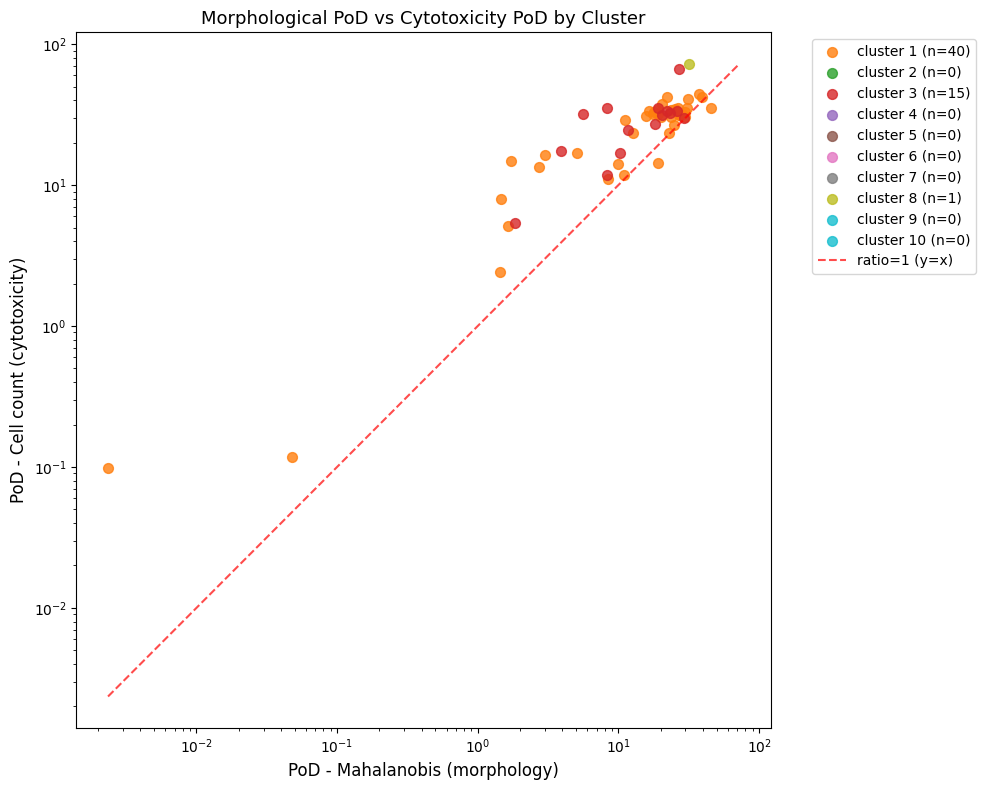


Specificity ratio summary:
count    56.000000
mean      2.825561
std       5.526435
min       0.748181
25%       1.255540
50%       1.586141
75%       2.334191
max      41.926106
Name: specificity_ratio, dtype: float64

ratio > 1 (morphology is likely to be more sensitive): 54 compounds
ratio < 1 (cytotoxicity is likely to be more sensitive): 2 compounds


In [ ]:
# Scatter plot for PoD for each cluster (slope: specificity ratio)
# 1. define df for plotting and colors based on cluster (shared_colors dic)
df_plot = df_hits_annotated[
    df_hits_annotated["PoD_mahal"].notna() &
    df_hits_annotated["PoD_cc"].notna()
].copy()

fig, ax = plt.subplots(figsize=(10, 8))

for cluster_id in sorted(df_hits_annotated["cluster"].unique()):
    df_c = df_plot[df_plot["cluster"] == cluster_id]
    ax.scatter(
        df_c["PoD_mahal"], df_c["PoD_cc"],
        color=shared_colors[cluster_id],
        s=50, alpha=0.8,
        label=f"cluster {cluster_id} (n={len(df_c)})"
    )

# 2. y=x line (specificity ratio = 1)
min_val = min(df_plot["PoD_mahal"].min(), df_plot["PoD_cc"].min())
max_val = max(df_plot["PoD_mahal"].max(), df_plot["PoD_cc"].max())
ax.plot([min_val, max_val], [min_val, max_val],
        color="red", linestyle="--", alpha=0.7, label="ratio=1 (y=x)")

ax.set_xscale("log")
ax.set_yscale("log")
ax.set_xlabel("PoD - Mahalanobis (morphology)", fontsize=12)
ax.set_ylabel("PoD - Cell count (cytotoxicity)", fontsize=12)
ax.set_title("Morphological PoD vs Cytotoxicity PoD by Cluster", fontsize=13)
ax.legend(bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.show()

# Check specificity ratio distribution
print("\nSpecificity ratio summary:")
print(df_hits_annotated["specificity_ratio"].describe())
print(f"\nratio > 1 (morphology is likely to be more sensitive): {(df_hits_annotated['specificity_ratio'] > 1).sum()} compounds")
print(f"ratio < 1 (cytotoxicity is likely to be more sensitive): {(df_hits_annotated['specificity_ratio'] < 1).sum()} compounds")

In [ ]:
# List of top 20 compounds based on specificity ratio
df_hits_annotated.sort_values(by = "specificity_ratio", ascending = False).head(20)

,Metadata_Compound,cluster,Metadata_compound_target,Metadata_compound_pathway,PoD_mahal,PoD_cc,specificity_ratio
366,Plicamycin,1,Antibiotic; Bacterial; DNA/RNA Synthesis; Glut...,Anti-infection; Cell Cycle/DNA Damage; Metabol...,0.002351,0.098574,41.926106
376,Puromycin aminonucleoside,1,Aminopeptidase; Antibiotic; Apoptosis; Bacteri...,Anti-infection; Apoptosis; Metabolic Enzyme/Pr...,1.730183,14.939587,8.634688
385,Regorafenib,3,Autophagy; c-Kit; FGFR; PDGFR; Raf; RET; Tie; ...,Autophagy; MAPK/ERK Pathway; Protein Tyrosine ...,5.601883,31.865001,5.688266
204,Encorafenib,1,Raf,MAPK/ERK Pathway,3.031903,16.481260,5.435946
370,Pralsetinib,1,RET,Protein Tyrosine Kinase/RTK,1.462886,7.927577,5.419135
423,Sunitinib,1,Apoptosis; Autophagy; IRE1; Mitophagy; PDGFR; ...,Apoptosis; Autophagy; Cell Cycle/DNA Damage; P...,2.741306,13.363359,4.874815
41,Avapritinib,3,c-Kit; PDGFR,Protein Tyrosine Kinase/RTK,3.928863,17.519233,4.459110
354,Pazopanib,3,Autophagy; c-Kit; FGFR; PDGFR; VEGFR,Autophagy; Protein Tyrosine Kinase/RTK,8.311090,35.051265,4.217409
149,Compound_efdb9516,1,None,None,5.061237,16.981354,3.355179
368,Ponatinib (hydrochloride),1,Autophagy; Bcr-Abl; FGFR; PDGFR; Src; VEGFR,Autophagy; Protein Tyrosine Kinase/RTK,1.633922,5.155410,3.155237


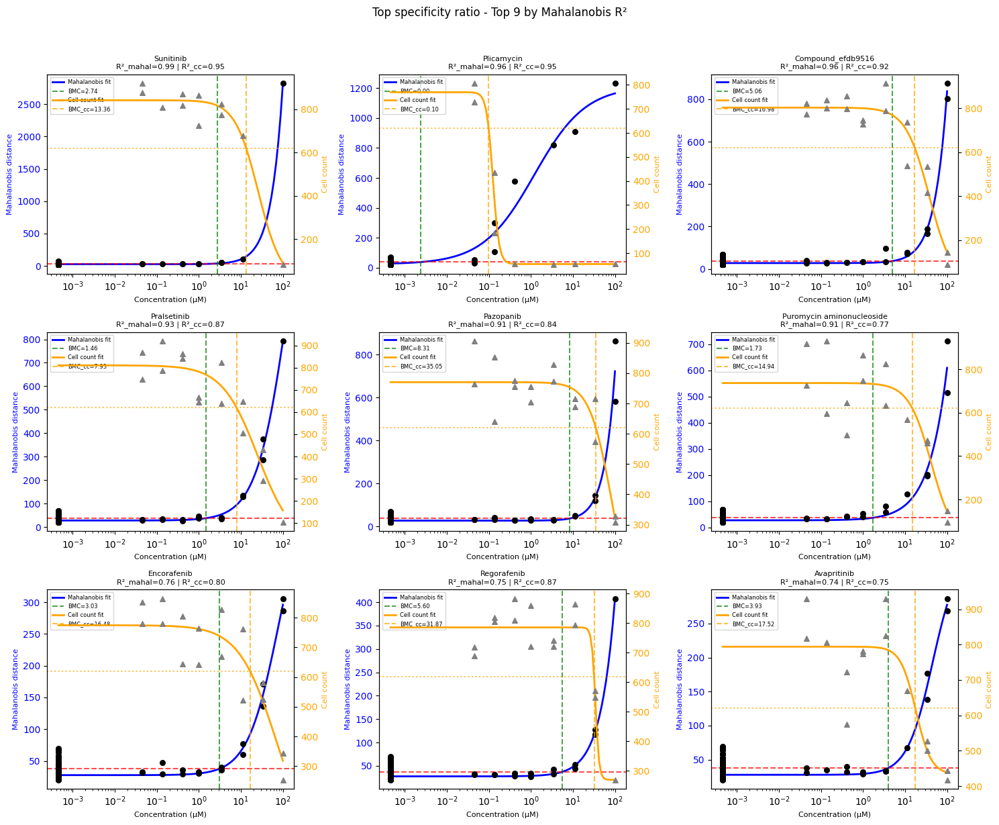

In [ ]:
# Top specificity ratio compounds CRC
top_specificity_ratio_compounds = df_hits_annotated.sort_values(by = "specificity_ratio", ascending = False).head(9)["Metadata_Compound"].tolist()

plot_dose_response_cluster(top_specificity_ratio_compounds, "Top specificity ratio")

Both: 56
Only mahal: 16
Only cell counts: 30


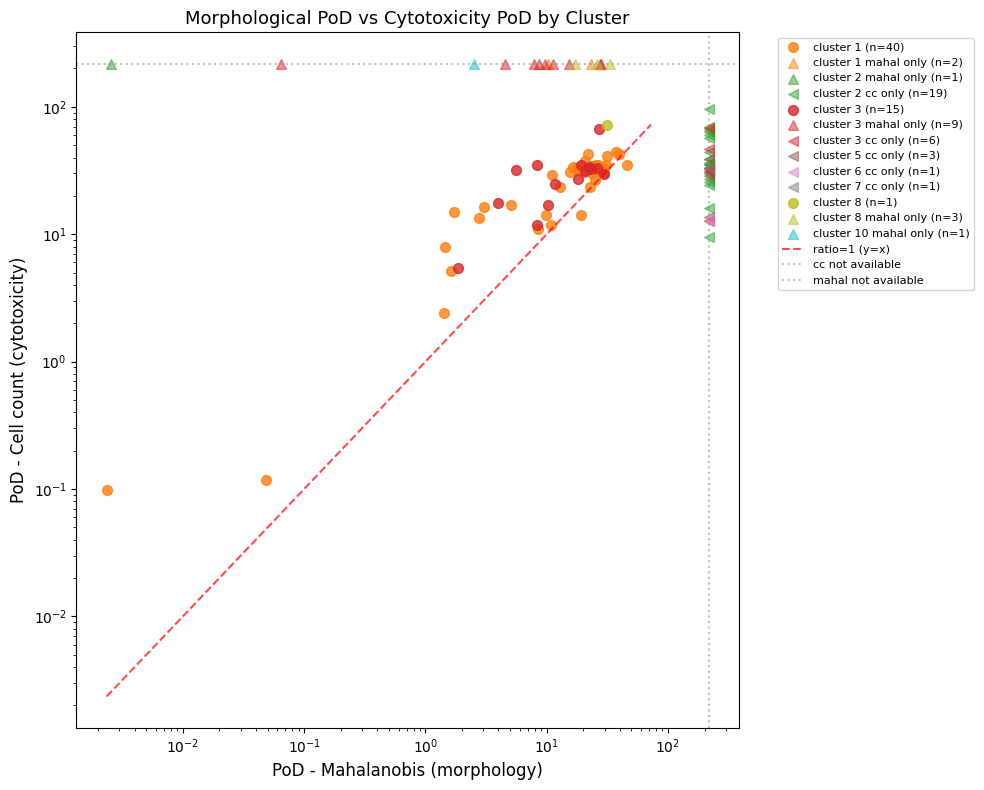

In [ ]:
# Scatter plot for PoD for each cluster (slope: specificity ratio) - ver 2: compds only with one PoD included
# Check the number of compounds with both / one values
both = df_hits_annotated["PoD_mahal"].notna() & df_hits_annotated["PoD_cc"].notna()
mahal_only = df_hits_annotated["PoD_mahal"].notna() & df_hits_annotated["PoD_cc"].isna()
cc_only = df_hits_annotated["PoD_mahal"].isna() & df_hits_annotated["PoD_cc"].notna()

print(f"Both: {both.sum()}")
print(f"Only mahal: {mahal_only.sum()}")
print(f"Only cell counts: {cc_only.sum()}")

# Define axis range (based on compounds with both values)
df_both = df_hits_annotated[both].copy()
min_val = min(df_both["PoD_mahal"].min(), df_both["PoD_cc"].min())
max_val = max(df_both["PoD_mahal"].max(), df_both["PoD_cc"].max())

# Define values when there is only one value
y_fixed = max_val * 3   # no cc -> upper side of y axis
x_fixed = max_val * 3   # no mahal -> upper side of x axis

fig, ax = plt.subplots(figsize=(10, 8))

for cluster_id in sorted(df_hits_annotated["cluster"].unique()):
    df_c = df_hits_annotated[df_hits_annotated["cluster"] == cluster_id]

    df_c_both = df_c[df_c["PoD_mahal"].notna() & df_c["PoD_cc"].notna()]
    if len(df_c_both) > 0:
        ax.scatter(df_c_both["PoD_mahal"], df_c_both["PoD_cc"],
                   color=shared_colors[cluster_id], s=50, alpha=0.8,
                   label=f"cluster {cluster_id} (n={len(df_c_both)})")

    df_c_mahal = df_c[df_c["PoD_mahal"].notna() & df_c["PoD_cc"].isna()]
    if len(df_c_mahal) > 0:
        ax.scatter(df_c_mahal["PoD_mahal"], [y_fixed] * len(df_c_mahal),
                   color=shared_colors[cluster_id], s=50, alpha=0.5, marker="^",
                   label=f"cluster {cluster_id} mahal only (n={len(df_c_mahal)})")

    df_c_cc = df_c[df_c["PoD_mahal"].isna() & df_c["PoD_cc"].notna()]
    if len(df_c_cc) > 0:
        ax.scatter([x_fixed] * len(df_c_cc), df_c_cc["PoD_cc"],
                   color=shared_colors[cluster_id], s=50, alpha=0.5, marker="<",
                   label=f"cluster {cluster_id} cc only (n={len(df_c_cc)})")

ax.plot([min_val, max_val], [min_val, max_val],
        color="red", linestyle="--", alpha=0.7, label="ratio=1 (y=x)")
ax.axhline(y=y_fixed, color="gray", linestyle=":", alpha=0.5, label="cc not available")
ax.axvline(x=x_fixed, color="gray", linestyle=":", alpha=0.5, label="mahal not available")

ax.set_xscale("log")
ax.set_yscale("log")
ax.set_xlabel("PoD - Mahalanobis (morphology)", fontsize=12)
ax.set_ylabel("PoD - Cell count (cytotoxicity)", fontsize=12)
ax.set_title("Morphological PoD vs Cytotoxicity PoD by Cluster", fontsize=13)
ax.legend(bbox_to_anchor=(1.05, 1), loc="upper left", fontsize=8)
plt.tight_layout()
plt.show()

# Additional: Tox group analaysis

In [ ]:
compound_groups = {}

group_keywords = {
    "AR": "Androgen Receptor",
    "AhR": "Aryl Hydrocarbon Receptor",
    "ER": "Estrogen Receptor",
    "PPAR": "PPAR",
    "Nrf2": "Nrf2",
    "MMP": "MMP",
    "Cholinesterase": "Cholinesterase"
}

for group, keyword in group_keywords.items():
    mask = df_raw['Metadata_compound_target'].str.contains(keyword, na=False)

    compounds = df_raw.loc[mask, 'Metadata_Compound'].unique().tolist()

    compound_groups[group] = compounds

compound_groups

{'AR': ['DHEA',
  'Nandrolone decanoate',
  'Bicalutamide',
  'Flutamide',
  'Tibolone',
  'Prochloraz',
  'Apalutamide',
  'Cyprodinil',
  'Danazol',
  'Enzalutamide'],
 'AhR': ['Alpha-Naphthoflavone',
  'Indole-3-carbinol',
  'Benzyl butyl phthalate',
  'Prochloraz',
  'β-Naphthoflavone',
  'Carbidopa'],
 'ER': ['Raloxifene',
  'Ethinylestradiol',
  'Tibolone',
  'Estradiol',
  'Chlorothalonil',
  'Prochloraz',
  'Mequinol',
  'Tamoxifen',
  'Cyclofenil',
  'Ospemifene'],
 'PPAR': ['Retinoic acid',
  'Fenofibrate',
  '5-Aminosalicylic Acid',
  'Ciprofibrate',
  'Bezafibrate',
  'Clofibrate',
  'Troglitazone',
  'Pioglitazone',
  'Gemfibrozil',
  'Pirinixic acid'],
 'Nrf2': ['Resveratrol',
  'Dimethyl fumarate',
  'Curcumin',
  'Pyridoxine',
  'Diroximel fumarate',
  'Ezetimibe',
  'Benzbromarone'],
 'MMP': ['Chloramphenicol',
  'Doxycycline',
  'Rilpivirine (hydrochloride)',
  'Meloxicam',
  'Edaravone'],
 'Cholinesterase': ['Donepezil',
  'Chlorpyrifos',
  'Malathion',
  'Penconazol

In [ ]:
# selected some interesting endpoints: AR, AhR, ER, PPAR, Nrf2 (ARE), MMP Cholinesterase
print(f"Androgen Receptor: {df_raw['Metadata_compound_target'].str.contains('Androgen Receptor', na=False).sum()}")
print(f"Aryl Hydrocarbon Receptor: {df_raw['Metadata_compound_target'].str.contains('Aryl Hydrocarbon Receptor', na=False).sum()}")
print(f"Estrogen Receptor: {df_raw['Metadata_compound_target'].str.contains('Estrogen Receptor', na=False).sum()}")
print(f"PPAR: {df_raw['Metadata_compound_target'].str.contains('PPAR', na=False).sum()}")
print(f"Nrf2: {df_raw['Metadata_compound_target'].str.contains('Nrf2', na=False).sum()}")
print(f"MMP: {df_raw['Metadata_compound_target'].str.contains('MMP', na=False).sum()}")
print(f"Cholinesterase: {df_raw['Metadata_compound_target'].str.contains('Cholinesterase', na=False).sum()}")

Androgen Receptor: 150
Aryl Hydrocarbon Receptor: 102
Estrogen Receptor: 147
PPAR: 150
Nrf2: 106
MMP: 77
Cholinesterase: 105


In [ ]:
# create group column
df_results_good['group'] = 'Other'

for group, compounds in compound_groups.items():
    mask = df_results_good['Metadata_Compound'].isin(compounds)
    df_results_good.loc[mask, 'group'] = group

df_results_good

,Metadata_Compound,bottom,top,ec50,hill,r2,BMC,PoD,conc_min,conc_max,fit_success,group
6,3-Iodoprop-2-yn-1-yl butylcarbamate,27.728695,1.220955e+03,75.562857,3.631462,0.928548,20.161314,20.161314,0.000456,100.0,True,Other
28,Amiodarone (hydrochloride),27.726378,2.930649e+04,593.428398,2.561785,0.717261,26.071895,26.071895,0.000456,100.0,True,Other
29,Amlodipine,27.731750,2.560486e+03,84.949823,5.292453,0.966722,29.737696,29.737696,0.000456,100.0,True,Other
34,Aripiprazole,27.728921,6.491874e+02,50.842145,6.647623,0.898615,27.282781,27.282781,0.000456,100.0,True,Other
36,Astemizole,27.723102,1.025171e+03,48.150620,2.916162,0.954552,9.887486,9.887486,0.000456,100.0,True,Other
...,...,...,...,...,...,...,...,...,...,...,...,...
446,Terfenadine,27.732847,4.651178e+03,179.085622,3.283721,0.920128,27.447663,27.447663,0.000456,100.0,True,Other
467,Triamterene,27.723088,4.260838e+03,204.954943,3.323823,0.813082,33.007428,33.007428,0.000456,100.0,True,Other
483,Voclosporin,27.734259,1.094085e+06,7404.178003,1.828161,0.848348,12.800749,12.800749,0.000456,100.0,True,Other
486,Vortioxetine,27.724398,6.590205e+04,1269.251837,1.852684,0.862066,10.884697,10.884697,0.000456,100.0,True,Other


In [ ]:
df_plot = df_results_good[['Metadata_Compound', 'group', 'BMC']].dropna()

/tmp/ipykernel_4671/3265052567.py:17: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(bbox_to_anchor=(1.05,1), loc='upper left')


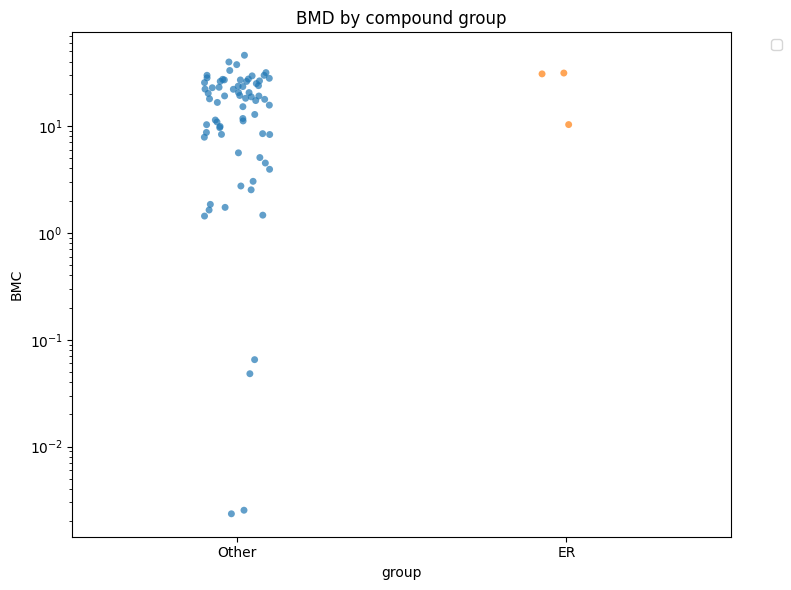

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(8,6))

sns.stripplot(
    data=df_plot,
    x='group',
    y='BMC',
    hue='group',
    jitter=True,
    alpha=0.7
)

plt.yscale('log')  # BMD in log scale
plt.title("BMD by compound group")
plt.legend(bbox_to_anchor=(1.05,1), loc='upper left')
plt.tight_layout()
plt.show()

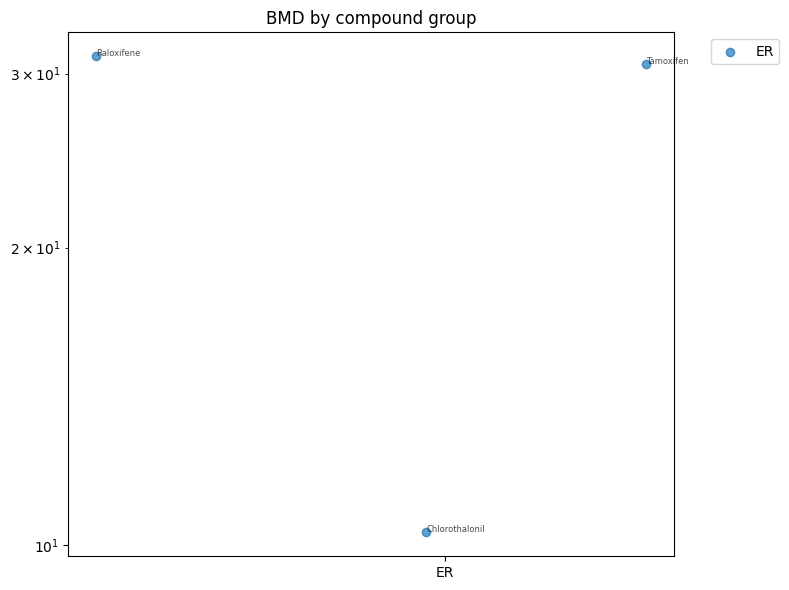

In [ ]:
df_plot_filtered = df_plot[df_plot['group'] != 'Other'].copy()

import matplotlib.pyplot as plt
import numpy as np

plt.figure(figsize=(8,6))

groups = df_plot_filtered['group'].unique()

for i, group in enumerate(groups):
    subset = df_plot_filtered[df_plot_filtered['group'] == group]

    x = np.random.normal(i, 0.05, size=len(subset))  # jitter
    y = subset['BMC']

    plt.scatter(x, y, label=group, alpha=0.7)

    for xi, yi, name in zip(x, y, subset['Metadata_Compound']):
        plt.text(xi, yi, name, fontsize=6, alpha=0.7)

plt.xticks(range(len(groups)), groups)
plt.yscale('log')

plt.title("BMD by compound group")
plt.legend(bbox_to_anchor=(1.05,1), loc='upper left')
plt.tight_layout()
plt.show()